# SAM-family Instance Segmentation Benchmark for EWU Shrimp Disease on Kaggle

Notebook này chạy các model **SAM / SAM2 / MobileSAM / FastSAM** trên bộ EWU Shrimp Disease theo cấu trúc input/output giống notebook YOLO Kaggle.

Điểm quan trọng:

- YOLO-seg là model **detect + instance segment** và có thể train trực tiếp với class `blackgill`, `whitespot`.
- SAM-family là model **promptable segmentation**, thường không tự phân loại `blackgill/whitespot`.
- Vì dataset đã có YOLO polygon label, notebook này dùng **GT box prompt** sinh từ polygon label để đánh giá khả năng tạo mask của SAM.
- Output chính là **instance-level IoU/Dice** giữa SAM mask và GT polygon mask theo từng class.

Cấu trúc output giống style notebook YOLO:

```text
/kaggle/working/shrimp_yolo_workdir
/kaggle/working/shrimp_yolo_outputs/sam_runs
/kaggle/working/shrimp_yolo_outputs/sam_analysis
```

## 1. Cài đặt thư viện

Bật Internet trong Kaggle nếu cần tải weights từ Ultralytics/Roboflow.

In [1]:

!pip install -q -U ultralytics roboflow opencv-python pandas matplotlib pyyaml tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 39.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 114.1 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 105.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 64.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 76.3 MB/s eta 0:00:00:00:010:01
ERROR: pip's dependency resolver does not currently take into account all the pa

## 2. Import và cấu hình đường dẫn Kaggle

- Nếu dùng Roboflow: thêm Kaggle Secret tên `ROBOFLOW_API_KEY`.
- Nếu dùng Kaggle Input: set `USE_ROBOFLOW_DOWNLOAD = False` và sửa `KAGGLE_DATASET_DIR`.

In [2]:

from pathlib import Path
import os
import random
import shutil
import time
import yaml
from collections import Counter, defaultdict

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

from ultralytics import SAM
try:
    from ultralytics import FastSAM
except Exception:
    FastSAM = None

# Kaggle paths: keep same style as YOLO notebook
KAGGLE_INPUT_DIR = Path('/kaggle/input')
KAGGLE_WORKING_DIR = Path('/kaggle/working')

WORK_DIR = KAGGLE_WORKING_DIR / 'shrimp_yolo_workdir'
OUTPUT_DIR = KAGGLE_WORKING_DIR / 'shrimp_yolo_outputs'
SAM_RUNS_DIR = OUTPUT_DIR / 'sam_runs'
SAM_ANALYSIS_DIR = OUTPUT_DIR / 'sam_analysis'

for p in [WORK_DIR, OUTPUT_DIR, SAM_RUNS_DIR, SAM_ANALYSIS_DIR]:
    p.mkdir(parents=True, exist_ok=True)

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

print('WORK_DIR:', WORK_DIR)
print('OUTPUT_DIR:', OUTPUT_DIR)
print('SAM_RUNS_DIR:', SAM_RUNS_DIR)
print('SAM_ANALYSIS_DIR:', SAM_ANALYSIS_DIR)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
WORK_DIR: /kaggle/working/shrimp_yolo_workdir
OUTPUT_DIR: /kaggle/working/shrimp_yolo_outputs
SAM_RUNS_DIR: /kaggle/working/shrimp_yolo_outputs/sam_runs
SAM_ANALYSIS_DIR: /kaggle/working/shrimp_yolo_outputs/sam_analysis


## 3. Dataset input

Mặc định notebook tải dataset từ Roboflow. Nếu bạn đã add dataset vào Kaggle Input, đổi `USE_ROBOFLOW_DOWNLOAD = False`.

In [3]:

USE_ROBOFLOW_DOWNLOAD = True

# Nếu dùng Kaggle Input, sửa path này tới folder chứa data.yaml
# Ví dụ: /kaggle/input/ewu-shrimp-disease/ewu_shrimp_disease-1
KAGGLE_DATASET_DIR = Path('/kaggle/input/your-dataset-folder/ewu_shrimp_disease-1')

if USE_ROBOFLOW_DOWNLOAD:
    from kaggle_secrets import UserSecretsClient
    from roboflow import Roboflow

    user_secrets = UserSecretsClient()
    ROBOFLOW_API_KEY = user_secrets.get_secret('ROBOFLOW_API_KEY')

    rf = Roboflow(api_key=ROBOFLOW_API_KEY)
    project = rf.workspace('shirmpdiseasedtection').project('ewu_shrimp_disease')
    dataset = project.version(1).download('yolov8', location=str(WORK_DIR / 'roboflow_ewu_shrimp_disease'))
    RAW_DATASET_DIR = Path(dataset.location)
else:
    RAW_DATASET_DIR = KAGGLE_DATASET_DIR

print('RAW_DATASET_DIR:', RAW_DATASET_DIR)
print('data.yaml exists:', (RAW_DATASET_DIR / 'data.yaml').exists())

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /kaggle/working/shrimp_yolo_workdir/roboflow_ewu_shrimp_disease in yolov8:: 100%|██████████| 2255/2255 [00:00<00:00, 3266.58it/s]


RAW_DATASET_DIR: /kaggle/working/shrimp_yolo_workdir/roboflow_ewu_shrimp_disease
data.yaml exists: True


## 4. Utility functions cho YOLO segmentation labels

Dataset hiện tại có 2 class instance segmentation:

```text
0: blackgill
1: whitespot
```

Ảnh `empty` là ảnh không có bệnh, file label rỗng, không phải class trong `data.yaml`.

In [4]:

def load_yaml(path):
    with open(path, 'r') as f:
        return yaml.safe_load(f)


def normalize_names(names):
    if isinstance(names, dict):
        return [names[i] for i in range(len(names))]
    return list(names)


def list_images(img_dir):
    img_dir = Path(img_dir)
    images = []
    for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.webp']:
        images.extend(list(img_dir.glob(ext)))
    return sorted(images)


def find_split_dirs(dataset_dir, split='train'):
    dataset_dir = Path(dataset_dir)
    # Roboflow raw format: dataset/train/images
    img_dir_1 = dataset_dir / split / 'images'
    label_dir_1 = dataset_dir / split / 'labels'
    # Standard Ultralytics format: dataset/images/train
    img_dir_2 = dataset_dir / 'images' / split
    label_dir_2 = dataset_dir / 'labels' / split

    if img_dir_1.exists() and label_dir_1.exists():
        return img_dir_1, label_dir_1
    if img_dir_2.exists() and label_dir_2.exists():
        return img_dir_2, label_dir_2

    raise FileNotFoundError(f'Cannot find dirs for split={split} under {dataset_dir}')


def get_label_signature(label_path):
    label_path = Path(label_path)
    if not label_path.exists():
        return 'empty'
    text = label_path.read_text().strip()
    if text == '':
        return 'empty'

    cls_ids = set()
    for line in text.splitlines():
        parts = line.strip().split()
        if len(parts) < 7:
            continue
        try:
            cls_ids.add(int(float(parts[0])))
        except Exception:
            continue
    if not cls_ids:
        return 'empty'
    return '_'.join(map(str, sorted(cls_ids)))


def read_yolo_seg_instances(label_path):
    """Read YOLO polygon label. Return list of {class_id, polygon_norm}."""
    label_path = Path(label_path)
    instances = []
    if not label_path.exists():
        return instances
    text = label_path.read_text().strip()
    if text == '':
        return instances

    for line in text.splitlines():
        parts = line.strip().split()
        if len(parts) < 7:
            continue
        try:
            cls_id = int(float(parts[0]))
            coords = [float(x) for x in parts[1:]]
        except Exception:
            continue
        if len(coords) < 6 or len(coords) % 2 != 0:
            continue
        polygon = []
        for i in range(0, len(coords), 2):
            polygon.append((coords[i], coords[i + 1]))
        instances.append({'class_id': cls_id, 'polygon_norm': polygon})
    return instances


def polygon_norm_to_box_xyxy(poly, w, h, pad_ratio=0.02):
    xs = np.array([p[0] for p in poly], dtype=np.float32) * w
    ys = np.array([p[1] for p in poly], dtype=np.float32) * h
    x1, y1, x2, y2 = xs.min(), ys.min(), xs.max(), ys.max()

    # Pad a little so SAM has enough context
    bw, bh = max(1.0, x2 - x1), max(1.0, y2 - y1)
    pad_x, pad_y = bw * pad_ratio, bh * pad_ratio
    x1 = max(0.0, x1 - pad_x)
    y1 = max(0.0, y1 - pad_y)
    x2 = min(float(w - 1), x2 + pad_x)
    y2 = min(float(h - 1), y2 + pad_y)
    return [float(x1), float(y1), float(x2), float(y2)]


def polygon_norm_to_mask(poly, w, h):
    pts = np.array([[int(x * w), int(y * h)] for x, y in poly], dtype=np.int32)
    mask = np.zeros((h, w), dtype=np.uint8)
    if len(pts) >= 3:
        cv2.fillPoly(mask, [pts], 1)
    return mask.astype(bool)


def resize_pred_mask_to_orig(mask, h, w):
    mask = mask.astype(np.float32)
    if mask.shape[:2] != (h, w):
        mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
    return mask > 0.5


def mask_iou_dice(pred, gt):
    pred = pred.astype(bool)
    gt = gt.astype(bool)
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    pred_sum = pred.sum()
    gt_sum = gt.sum()
    iou = inter / union if union > 0 else 0.0
    dice = (2 * inter) / (pred_sum + gt_sum) if (pred_sum + gt_sum) > 0 else 0.0
    return float(iou), float(dice)

print('Utilities loaded.')

Utilities loaded.


## 5. Kiểm tra cấu trúc data gốc

In [5]:

raw_cfg = load_yaml(RAW_DATASET_DIR / 'data.yaml')
CLASS_NAMES = normalize_names(raw_cfg['names'])
print('Raw data.yaml:')
print(yaml.safe_dump(raw_cfg, sort_keys=False))
print('Class names:', CLASS_NAMES)

for split in ['train', 'valid', 'val', 'test']:
    try:
        img_dir, label_dir = find_split_dirs(RAW_DATASET_DIR, split)
        print(f'{split}: {len(list_images(img_dir))} images, {len(list(label_dir.glob("*.txt")))} labels')
    except Exception:
        pass

Raw data.yaml:
names:
- blackgill
- whitespot
nc: 2
roboflow:
  license: CC BY 4.0
  project: ewu_shrimp_disease
  url: https://universe.roboflow.com/shirmpdiseasedtection/ewu_shrimp_disease/dataset/1
  version: 1
  workspace: shirmpdiseasedtection
test: ../test/images
train: ../train/images
val: ../valid/images

Class names: ['blackgill', 'whitespot']
train: 1126 images, 1126 labels


## 6. Tạo natural split 80/10/10 nếu dataset chỉ có train

Cell này giữ nguyên dataset gốc và tạo dataset mới ở:

```text
/kaggle/working/shrimp_yolo_workdir/EWU_shrimp_split_natural
```

Split được stratify theo signature: `0`, `1`, `0_1`, `empty`.

In [6]:

NATURAL_SPLIT_DIR = WORK_DIR / 'EWU_shrimp_split_natural'
TRAIN_RATIO, VAL_RATIO, TEST_RATIO = 0.8, 0.1, 0.1

# Decide source: if raw valid/test empty, split from raw train
SOURCE_IMG_DIR, SOURCE_LABEL_DIR = find_split_dirs(RAW_DATASET_DIR, 'train')

if NATURAL_SPLIT_DIR.exists():
    shutil.rmtree(NATURAL_SPLIT_DIR)

for split in ['train', 'val', 'test']:
    (NATURAL_SPLIT_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
    (NATURAL_SPLIT_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)

images = list_images(SOURCE_IMG_DIR)
print('Total source images:', len(images))

groups = defaultdict(list)
for img_path in images:
    label_path = SOURCE_LABEL_DIR / f'{img_path.stem}.txt'
    groups[get_label_signature(label_path)].append(img_path)

print('Groups before split:')
for sig, items in sorted(groups.items()):
    print(f'{sig}: {len(items)}')

split_items = {'train': [], 'val': [], 'test': []}
for sig, items in sorted(groups.items()):
    items = items.copy()
    random.shuffle(items)
    n = len(items)
    n_train = int(n * TRAIN_RATIO)
    n_val = int(n * VAL_RATIO)
    split_items['train'].extend(items[:n_train])
    split_items['val'].extend(items[n_train:n_train+n_val])
    split_items['test'].extend(items[n_train+n_val:])

for split in split_items:
    random.shuffle(split_items[split])
    print(split, len(split_items[split]))

for split, items in split_items.items():
    for img_path in tqdm(items, desc=f'Copy {split}'):
        label_path = SOURCE_LABEL_DIR / f'{img_path.stem}.txt'
        dst_img = NATURAL_SPLIT_DIR / 'images' / split / img_path.name
        dst_label = NATURAL_SPLIT_DIR / 'labels' / split / f'{img_path.stem}.txt'
        shutil.copy2(img_path, dst_img)
        if label_path.exists():
            shutil.copy2(label_path, dst_label)
        else:
            dst_label.write_text('')

new_cfg = {
    'path': str(NATURAL_SPLIT_DIR),
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES,
}
with open(NATURAL_SPLIT_DIR / 'data.yaml', 'w') as f:
    yaml.safe_dump(new_cfg, f, sort_keys=False)

print('Saved:', NATURAL_SPLIT_DIR)
print(yaml.safe_dump(new_cfg, sort_keys=False))

Total source images: 1126
Groups before split:
0: 96
1: 478
empty: 552
train 899
val 111
test 116


Copy test: 100%|██████████| 116/116 [00:00<00:00, 2302.58it/s]

Saved: /kaggle/working/shrimp_yolo_workdir/EWU_shrimp_split_natural
path: /kaggle/working/shrimp_yolo_workdir/EWU_shrimp_split_natural
train: images/train
val: images/val
test: images/test
nc: 2
names:
- blackgill
- whitespot



## 7. Kiểm tra phân bố split

In [8]:

def check_distribution(dataset_dir):
    dataset_dir = Path(dataset_dir)
    cfg = load_yaml(dataset_dir / 'data.yaml')
    names = normalize_names(cfg['names'])

    for split in ['train', 'val', 'test']:
        img_dir, label_dir = find_split_dirs(dataset_dir, split)
        images = list_images(img_dir)
        sig_counter = Counter()
        obj_counter = Counter()
        img_counter = Counter()
        for img_path in images:
            label_path = label_dir / f'{img_path.stem}.txt'
            sig = get_label_signature(label_path)
            sig_counter[sig] += 1
            insts = read_yolo_seg_instances(label_path)
            cls_set = set()
            for inst in insts:
                cid = inst['class_id']
                obj_counter[cid] += 1
                cls_set.add(cid)
            for cid in cls_set:
                img_counter[cid] += 1
        print('' + split.upper())
        print('Images:', len(images))
        print('Signature:', dict(sig_counter))
        for i, name in enumerate(names):
            print(f'{i} - {name}: {img_counter[i]} images, {obj_counter[i]} objects')

check_distribution(NATURAL_SPLIT_DIR)

TRAIN
Images: 899
Signature: {'1': 382, '0': 76, 'empty': 441}
0 - blackgill: 76 images, 78 objects
1 - whitespot: 382 images, 757 objects
VAL
Images: 111
Signature: {'1': 47, '0': 9, 'empty': 55}
0 - blackgill: 9 images, 11 objects
1 - whitespot: 47 images, 99 objects
TEST
Images: 116
Signature: {'1': 49, '0': 11, 'empty': 56}
0 - blackgill: 11 images, 12 objects
1 - whitespot: 49 images, 104 objects


## 8. Hiển thị class distribution barplot

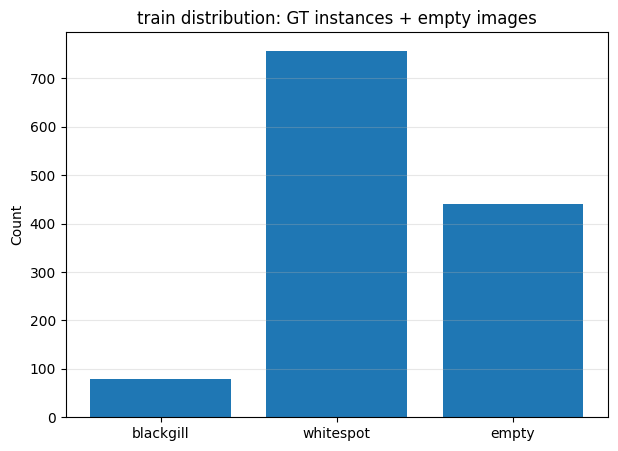

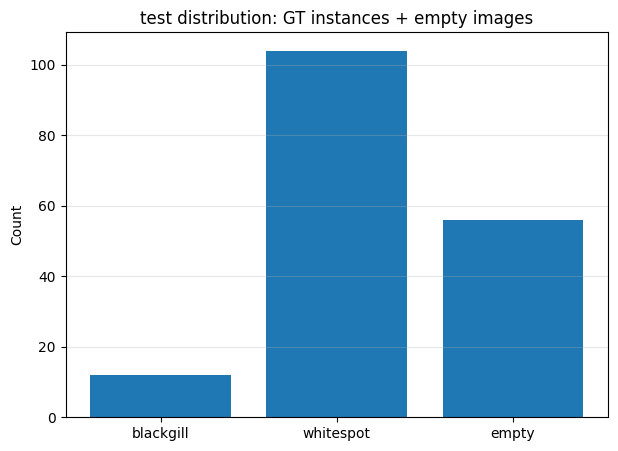

In [9]:

def plot_class_distribution(dataset_dir, split='test'):
    dataset_dir = Path(dataset_dir)
    cfg = load_yaml(dataset_dir / 'data.yaml')
    names = normalize_names(cfg['names'])
    img_dir, label_dir = find_split_dirs(dataset_dir, split)
    images = list_images(img_dir)

    sig_counter = Counter()
    obj_counter = Counter()
    for img_path in images:
        label_path = label_dir / f'{img_path.stem}.txt'
        sig_counter[get_label_signature(label_path)] += 1
        for inst in read_yolo_seg_instances(label_path):
            obj_counter[inst['class_id']] += 1

    labels = names + ['empty']
    values = [obj_counter[i] for i in range(len(names))] + [sig_counter['empty']]

    plt.figure(figsize=(7, 5))
    plt.bar(labels, values)
    plt.title(f'{split} distribution: GT instances + empty images')
    plt.ylabel('Count')
    plt.grid(axis='y', alpha=0.3)
    plt.show()

plot_class_distribution(NATURAL_SPLIT_DIR, 'train')
plot_class_distribution(NATURAL_SPLIT_DIR, 'test')

## 9. Cấu hình SAM-family models

Khuyến nghị chạy trước `mobile_sam.pt` và `sam2_t.pt` vì nhẹ hơn. Sau khi ổn mới thêm `sam_b.pt`, `sam2_b.pt`, `FastSAM-s.pt`.

In [10]:

SAM_MODELS_FAST = [
    'mobile_sam.pt',
    'sam2_t.pt',
]

SAM_MODELS_FULL = [
    'mobile_sam.pt',
    'sam_b.pt',
    'sam2_t.pt',
    'sam2_s.pt',
    'sam2_b.pt',
    'FastSAM-s.pt',
]

# Experimental, may require latest ultralytics and special predictor
SAM_MODELS_EXPERIMENTAL = [
    'sam3.pt',
]

SAM_MODELS = SAM_MODELS_FULL
print('Selected SAM models:', SAM_MODELS)

SAM_EVAL_DATASET_DIR = NATURAL_SPLIT_DIR
SAM_EVAL_SPLIT = 'test'
SAM_IMGSZ = 1024   # SAM/FastSAM often uses larger size
SAM_DEVICE = 0
SAM_CONF = 0.25
SAM_BOX_PAD_RATIO = 0.02

print('SAM_EVAL_DATASET_DIR:', SAM_EVAL_DATASET_DIR)
print('SAM_EVAL_SPLIT:', SAM_EVAL_SPLIT)

Selected SAM models: ['mobile_sam.pt', 'sam_b.pt', 'sam2_t.pt', 'sam2_s.pt', 'sam2_b.pt', 'FastSAM-s.pt']
SAM_EVAL_DATASET_DIR: /kaggle/working/shrimp_yolo_workdir/EWU_shrimp_split_natural
SAM_EVAL_SPLIT: test


## 10. Kiểm tra load SAM models

Nếu model chưa có trong cache, Kaggle cần bật Internet để tải weight.

In [11]:

available_sam_models = []

for model_name in SAM_MODELS:
    print('Checking:', model_name)
    try:
        if model_name.startswith('FastSAM'):
            if FastSAM is None:
                raise ImportError('FastSAM import failed')
            m = FastSAM(model_name)
        else:
            m = SAM(model_name)
        available_sam_models.append(model_name)
        print('[OK]', model_name)
    except Exception as e:
        print('[SKIP]', model_name)
        print(e)

print('Available SAM models:', available_sam_models)

Checking: mobile_sam.pt
[OK] mobile_sam.pt
Checking: sam_b.pt
[OK] sam_b.pt
Checking: sam2_t.pt
[OK] sam2_t.pt
Checking: sam2_s.pt
[OK] sam2_s.pt
Checking: sam2_b.pt
[OK] sam2_b.pt
Checking: FastSAM-s.pt
[OK] FastSAM-s.pt
Available SAM models: ['mobile_sam.pt', 'sam_b.pt', 'sam2_t.pt', 'sam2_s.pt', 'sam2_b.pt', 'FastSAM-s.pt']


## 11. Chạy SAM với GT box prompts và tính IoU/Dice từng instance

Đây là **oracle box-prompted instance segmentation**:

```text
GT polygon -> GT box prompt -> SAM mask -> so sánh với GT polygon mask
```

Kết quả này không thay thế YOLO mAP, nhưng cho biết SAM có thể refine mask tốt đến đâu khi có box prompt.

In [12]:

def pixel_mask_metrics(pred_mask, gt_mask, eps=1e-7):
    """Pixel-level metrics for one predicted mask and one GT mask."""
    pred = pred_mask.astype(bool)
    gt = gt_mask.astype(bool)

    tp = np.logical_and(pred, gt).sum()
    fp = np.logical_and(pred, ~gt).sum()
    fn = np.logical_and(~pred, gt).sum()
    tn = np.logical_and(~pred, ~gt).sum()

    precision = tp / (tp + fp + eps)
    recall = tp / (tp + fn + eps)
    f1 = 2 * precision * recall / (precision + recall + eps)
    specificity = tn / (tn + fp + eps)

    return {
        'pixel_tp': int(tp),
        'pixel_fp': int(fp),
        'pixel_fn': int(fn),
        'pixel_tn': int(tn),
        'pixel_precision': float(precision),
        'pixel_recall': float(recall),
        'pixel_f1': float(f1),
        'pixel_specificity': float(specificity),
    }


def run_sam_prompted_evaluation(
    sam_model_name,
    dataset_dir,
    split='test',
    imgsz=1024,
    device=0,
    box_pad_ratio=0.02,
    save_predictions=True,
):
    dataset_dir = Path(dataset_dir)
    cfg = load_yaml(dataset_dir / 'data.yaml')
    names = normalize_names(cfg['names'])
    img_dir, label_dir = find_split_dirs(dataset_dir, split)
    image_paths = list_images(img_dir)

    if sam_model_name.startswith('FastSAM'):
        if FastSAM is None:
            raise ImportError('FastSAM is not available in this ultralytics install')
        model = FastSAM(sam_model_name)
    else:
        model = SAM(sam_model_name)

    run_name = f'{sam_model_name.replace(".pt", "")}_{split}_gtbox'
    pred_dir = SAM_RUNS_DIR / run_name
    pred_dir.mkdir(parents=True, exist_ok=True)

    records = []
    image_records = []

    total_start = time.time()

    for img_path in tqdm(image_paths, desc=f'{sam_model_name} {split}'):
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            continue
        h, w = img_bgr.shape[:2]
        label_path = label_dir / f'{img_path.stem}.txt'
        instances = read_yolo_seg_instances(label_path)

        if len(instances) == 0:
            image_records.append({
                'sam_model': sam_model_name,
                'image': img_path.name,
                'gt_signature': 'empty',
                'num_gt_instances': 0,
                'num_pred_masks': 0,
                'prompt_return_rate': np.nan,
                'mean_iou_image': np.nan,
                'mean_dice_image': np.nan,
                'mean_pixel_f1_image': np.nan,
                'iou50_success_rate_image': np.nan,
                'iou75_success_rate_image': np.nan,
                'runtime_sec': 0.0,
                'runtime_ms_per_image': 0.0,
                'runtime_ms_per_instance': np.nan,
                'status': 'empty_skipped_no_prompt',
            })
            continue

        boxes = []
        gt_masks = []
        gt_cls_ids = []
        for inst in instances:
            poly = inst['polygon_norm']
            boxes.append(polygon_norm_to_box_xyxy(poly, w, h, pad_ratio=box_pad_ratio))
            gt_masks.append(polygon_norm_to_mask(poly, w, h))
            gt_cls_ids.append(inst['class_id'])

        t0 = time.time()
        try:
            results = model.predict(
                source=str(img_path),
                bboxes=boxes,
                imgsz=imgsz,
                device=device,
                save=save_predictions,
                project=str(SAM_RUNS_DIR),
                name=run_name,
                exist_ok=True,
                verbose=False,
            )
            runtime = time.time() - t0
        except Exception as e:
            runtime = time.time() - t0
            image_records.append({
                'sam_model': sam_model_name,
                'image': img_path.name,
                'gt_signature': get_label_signature(label_path),
                'num_gt_instances': len(instances),
                'num_pred_masks': 0,
                'prompt_return_rate': 0.0,
                'mean_iou_image': 0.0,
                'mean_dice_image': 0.0,
                'mean_pixel_f1_image': 0.0,
                'iou50_success_rate_image': 0.0,
                'iou75_success_rate_image': 0.0,
                'runtime_sec': runtime,
                'runtime_ms_per_image': runtime * 1000,
                'runtime_ms_per_instance': runtime * 1000 / max(len(instances), 1),
                'status': f'error: {str(e)}',
            })
            continue

        pred_masks = []
        if results and len(results) > 0 and results[0].masks is not None and results[0].masks.data is not None:
            pred_masks_np = results[0].masks.data.detach().cpu().numpy()
            for pm in pred_masks_np:
                pred_masks.append(resize_pred_mask_to_orig(pm, h, w))

        per_image_ious = []
        per_image_dices = []
        per_image_f1s = []
        per_image_iou50 = []
        per_image_iou75 = []

        # Match by order of prompts. If fewer masks returned, missing masks get zero metrics.
        for idx, gt_mask in enumerate(gt_masks):
            cls_id = gt_cls_ids[idx]
            cls_name = names[cls_id] if cls_id < len(names) else f'unknown_{cls_id}'
            gt_area_ratio = float(gt_mask.sum() / gt_mask.size)

            if idx < len(pred_masks):
                pred_mask = pred_masks[idx]
                iou, dice = mask_iou_dice(pred_mask, gt_mask)
                pred_area_ratio = float(pred_mask.sum() / pred_mask.size)
                returned_mask = True
                pix = pixel_mask_metrics(pred_mask, gt_mask)
            else:
                iou, dice, pred_area_ratio = 0.0, 0.0, 0.0
                returned_mask = False
                pix = {
                    'pixel_tp': 0,
                    'pixel_fp': 0,
                    'pixel_fn': int(gt_mask.sum()),
                    'pixel_tn': int(gt_mask.size - gt_mask.sum()),
                    'pixel_precision': 0.0,
                    'pixel_recall': 0.0,
                    'pixel_f1': 0.0,
                    'pixel_specificity': 1.0,
                }

            area_abs_error = abs(pred_area_ratio - gt_area_ratio)
            area_rel_error = area_abs_error / (gt_area_ratio + 1e-7)
            iou50 = float(iou >= 0.50)
            iou75 = float(iou >= 0.75)
            iou90 = float(iou >= 0.90)

            per_image_ious.append(iou)
            per_image_dices.append(dice)
            per_image_f1s.append(pix['pixel_f1'])
            per_image_iou50.append(iou50)
            per_image_iou75.append(iou75)

            records.append({
                'sam_model': sam_model_name,
                'image': img_path.name,
                'instance_index': idx,
                'class_id': cls_id,
                'class_name': cls_name,
                'box_x1': boxes[idx][0],
                'box_y1': boxes[idx][1],
                'box_x2': boxes[idx][2],
                'box_y2': boxes[idx][3],
                'gt_area_ratio': gt_area_ratio,
                'pred_area_ratio': pred_area_ratio,
                'area_abs_error': area_abs_error,
                'area_rel_error': area_rel_error,
                'returned_mask': returned_mask,
                'mask_iou': iou,
                'mask_dice': dice,
                'iou50_success': iou50,
                'iou75_success': iou75,
                'iou90_success': iou90,
                **pix,
                'runtime_sec_image': runtime,
                'runtime_ms_per_image': runtime * 1000,
                'runtime_ms_per_instance': runtime * 1000 / max(len(instances), 1),
                'num_gt_instances_image': len(instances),
                'num_pred_masks_image': len(pred_masks),
            })

        image_records.append({
            'sam_model': sam_model_name,
            'image': img_path.name,
            'gt_signature': get_label_signature(label_path),
            'num_gt_instances': len(instances),
            'num_pred_masks': len(pred_masks),
            'prompt_return_rate': min(len(pred_masks), len(instances)) / max(len(instances), 1),
            'mean_iou_image': float(np.mean(per_image_ious)) if per_image_ious else 0.0,
            'mean_dice_image': float(np.mean(per_image_dices)) if per_image_dices else 0.0,
            'mean_pixel_f1_image': float(np.mean(per_image_f1s)) if per_image_f1s else 0.0,
            'iou50_success_rate_image': float(np.mean(per_image_iou50)) if per_image_iou50 else 0.0,
            'iou75_success_rate_image': float(np.mean(per_image_iou75)) if per_image_iou75 else 0.0,
            'runtime_sec': runtime,
            'runtime_ms_per_image': runtime * 1000,
            'runtime_ms_per_instance': runtime * 1000 / max(len(instances), 1),
            'status': 'ok',
        })

    total_time = time.time() - total_start
    inst_df = pd.DataFrame(records)
    img_df = pd.DataFrame(image_records)

    inst_df.to_csv(SAM_ANALYSIS_DIR / f'{run_name}_instance_metrics.csv', index=False)
    img_df.to_csv(SAM_ANALYSIS_DIR / f'{run_name}_image_metrics.csv', index=False)

    return inst_df, img_df, total_time


all_instance_dfs = []
all_image_dfs = []
sam_run_records = []

for sam_model_name in available_sam_models:
    print('\n' + '=' * 100)
    print('Running:', sam_model_name)
    print('=' * 100)
    try:
        inst_df, img_df, total_time = run_sam_prompted_evaluation(
            sam_model_name=sam_model_name,
            dataset_dir=SAM_EVAL_DATASET_DIR,
            split=SAM_EVAL_SPLIT,
            imgsz=SAM_IMGSZ,
            device=SAM_DEVICE,
            box_pad_ratio=SAM_BOX_PAD_RATIO,
            save_predictions=True,
        )
        all_instance_dfs.append(inst_df)
        all_image_dfs.append(img_df)
        sam_run_records.append({
            'sam_model': sam_model_name,
            'status': 'done',
            'num_instances_eval': len(inst_df),
            'num_images_eval': len(img_df),
            'total_time_sec': total_time,
            'avg_runtime_ms_per_image': img_df.loc[img_df['num_gt_instances'] > 0, 'runtime_ms_per_image'].mean() if len(img_df) else np.nan,
            'avg_runtime_ms_per_instance': inst_df['runtime_ms_per_instance'].mean() if len(inst_df) else np.nan,
        })
        print('Done:', sam_model_name, 'instances:', len(inst_df), 'time:', total_time)
    except Exception as e:
        print('[ERROR]', sam_model_name, e)
        sam_run_records.append({'sam_model': sam_model_name, 'status': f'error: {e}'})

sam_runs_df = pd.DataFrame(sam_run_records)
sam_runs_df.to_csv(SAM_ANALYSIS_DIR / 'sam_runs_summary.csv', index=False)
sam_runs_df



Running: mobile_sam.pt


mobile_sam.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   1%|          | 1/116 [00:01<03:29,  1.82s/it]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   2%|▏         | 2/116 [00:02<01:48,  1.05it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   3%|▎         | 3/116 [00:02<01:10,  1.60it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   3%|▎         | 4/116 [00:02<01:01,  1.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   4%|▍         | 5/116 [00:03<00:50,  2.20it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   5%|▌         | 6/116 [00:03<00:47,  2.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   6%|▌         | 7/116 [00:03<00:39,  2.73it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   7%|▋         | 8/116 [00:04<00:41,  2.58it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   8%|▊         | 9/116 [00:04<00:37,  2.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   9%|▊         | 10/116 [00:04<00:33,  3.12it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:   9%|▉         | 11/116 [00:04<00:29,  3.51it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  10%|█         | 12/116 [00:05<00:26,  3.88it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  11%|█         | 13/116 [00:05<00:27,  3.78it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  12%|█▏        | 14/116 [00:05<00:24,  4.10it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  13%|█▎        | 15/116 [00:05<00:23,  4.35it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  14%|█▍        | 16/116 [00:06<00:23,  4.32it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  15%|█▍        | 17/116 [00:06<00:25,  3.84it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  16%|█▌        | 18/116 [00:06<00:24,  3.97it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  16%|█▋        | 19/116 [00:06<00:23,  4.19it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  17%|█▋        | 20/116 [00:07<00:24,  3.98it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  18%|█▊        | 21/116 [00:07<00:22,  4.16it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  19%|█▉        | 22/116 [00:07<00:22,  4.17it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  20%|█▉        | 23/116 [00:07<00:21,  4.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  21%|██        | 24/116 [00:07<00:20,  4.46it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  22%|██▏       | 25/116 [00:08<00:20,  4.54it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  22%|██▏       | 26/116 [00:08<00:19,  4.63it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  23%|██▎       | 27/116 [00:08<00:21,  4.14it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  24%|██▍       | 28/116 [00:08<00:22,  3.90it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  25%|██▌       | 29/116 [00:09<00:21,  4.14it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  26%|██▌       | 30/116 [00:09<00:21,  4.08it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  27%|██▋       | 31/116 [00:09<00:19,  4.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  28%|██▊       | 32/116 [00:09<00:18,  4.42it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  28%|██▊       | 33/116 [00:10<00:18,  4.53it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  29%|██▉       | 34/116 [00:10<00:17,  4.61it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  30%|███       | 35/116 [00:10<00:18,  4.44it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  31%|███       | 36/116 [00:10<00:18,  4.43it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  32%|███▏      | 37/116 [00:10<00:18,  4.20it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  33%|███▎      | 38/116 [00:11<00:18,  4.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  34%|███▎      | 39/116 [00:11<00:17,  4.31it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  34%|███▍      | 40/116 [00:11<00:17,  4.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  35%|███▌      | 41/116 [00:11<00:17,  4.30it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  36%|███▌      | 42/116 [00:12<00:17,  4.32it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  42%|████▏     | 49/116 [00:12<00:05, 13.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  84%|████████▎ | 97/116 [00:13<00:00, 59.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  90%|████████▉ | 104/116 [00:14<00:00, 14.41it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  94%|█████████▍| 109/116 [00:15<00:00,  9.91it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test:  97%|█████████▋| 113/116 [00:16<00:00,  7.54it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox


mobile_sam.pt test: 100%|██████████| 116/116 [00:17<00:00,  6.66it/s]

Done: mobile_sam.pt instances: 116 time: 17.409822940826416

Running: sam_b.pt



sam_b.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   1%|          | 1/116 [00:00<01:24,  1.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   2%|▏         | 2/116 [00:01<01:17,  1.48it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   3%|▎         | 3/116 [00:01<01:07,  1.67it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   3%|▎         | 4/116 [00:02<01:12,  1.55it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   4%|▍         | 5/116 [00:03<01:09,  1.60it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   5%|▌         | 6/116 [00:03<01:10,  1.56it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   6%|▌         | 7/116 [00:04<01:07,  1.62it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   7%|▋         | 8/116 [00:05<01:11,  1.50it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   8%|▊         | 9/116 [00:05<01:08,  1.55it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   9%|▊         | 10/116 [00:06<01:04,  1.63it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:   9%|▉         | 11/116 [00:06<01:00,  1.72it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  10%|█         | 12/116 [00:07<00:57,  1.80it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  11%|█         | 13/116 [00:07<00:58,  1.76it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  12%|█▏        | 14/116 [00:08<00:55,  1.82it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  13%|█▎        | 15/116 [00:08<00:54,  1.86it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  14%|█▍        | 16/116 [00:09<00:53,  1.86it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  15%|█▍        | 17/116 [00:10<00:55,  1.77it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  16%|█▌        | 18/116 [00:10<00:55,  1.78it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  16%|█▋        | 19/116 [00:11<00:53,  1.82it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  17%|█▋        | 20/116 [00:11<00:53,  1.78it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  18%|█▊        | 21/116 [00:12<00:51,  1.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  19%|█▉        | 22/116 [00:12<00:51,  1.82it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  20%|█▉        | 23/116 [00:13<00:50,  1.85it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  21%|██        | 24/116 [00:13<00:48,  1.88it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  22%|██▏       | 25/116 [00:14<00:48,  1.89it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  22%|██▏       | 26/116 [00:14<00:47,  1.91it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  23%|██▎       | 27/116 [00:15<00:48,  1.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  24%|██▍       | 28/116 [00:16<00:49,  1.78it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  25%|██▌       | 29/116 [00:16<00:47,  1.81it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  26%|██▌       | 30/116 [00:17<00:47,  1.80it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  27%|██▋       | 31/116 [00:17<00:46,  1.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  28%|██▊       | 32/116 [00:18<00:45,  1.85it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  28%|██▊       | 33/116 [00:18<00:44,  1.87it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  29%|██▉       | 34/116 [00:19<00:43,  1.89it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  30%|███       | 35/116 [00:19<00:43,  1.85it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  31%|███       | 36/116 [00:20<00:43,  1.84it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  32%|███▏      | 37/116 [00:20<00:44,  1.79it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  33%|███▎      | 38/116 [00:21<00:43,  1.80it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  34%|███▎      | 39/116 [00:22<00:42,  1.81it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  34%|███▍      | 40/116 [00:22<00:41,  1.81it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  35%|███▌      | 41/116 [00:23<00:41,  1.82it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  36%|███▌      | 42/116 [00:23<00:40,  1.83it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  41%|████▏     | 48/116 [00:24<00:12,  5.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  81%|████████  | 94/116 [00:25<00:00, 44.76it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  87%|████████▋ | 101/116 [00:27<00:01, 10.04it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  91%|█████████▏| 106/116 [00:29<00:01,  5.51it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  95%|█████████▍| 110/116 [00:31<00:01,  4.30it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  97%|█████████▋| 113/116 [00:33<00:00,  3.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test:  99%|█████████▉| 115/116 [00:34<00:00,  2.99it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox


sam_b.pt test: 100%|██████████| 116/116 [00:34<00:00,  3.34it/s]

Done: sam_b.pt instances: 116 time: 34.78443670272827

Running: sam2_t.pt



sam2_t.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   1%|          | 1/116 [00:00<00:57,  2.00it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   2%|▏         | 2/116 [00:00<00:50,  2.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   3%|▎         | 3/116 [00:01<00:40,  2.79it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   3%|▎         | 4/116 [00:01<00:45,  2.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   4%|▍         | 5/116 [00:02<00:43,  2.55it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   5%|▌         | 6/116 [00:02<00:44,  2.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   6%|▌         | 7/116 [00:02<00:40,  2.67it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   7%|▋         | 8/116 [00:03<00:45,  2.38it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   8%|▊         | 9/116 [00:03<00:43,  2.48it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   9%|▊         | 10/116 [00:03<00:39,  2.69it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:   9%|▉         | 11/116 [00:04<00:35,  2.97it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  10%|█         | 12/116 [00:04<00:32,  3.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  11%|█         | 13/116 [00:04<00:33,  3.11it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  12%|█▏        | 14/116 [00:05<00:30,  3.30it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  13%|█▎        | 15/116 [00:05<00:29,  3.46it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  14%|█▍        | 16/116 [00:05<00:29,  3.40it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  15%|█▍        | 17/116 [00:06<00:31,  3.10it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  16%|█▌        | 18/116 [00:06<00:31,  3.14it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  16%|█▋        | 19/116 [00:06<00:29,  3.32it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  17%|█▋        | 20/116 [00:06<00:30,  3.20it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  18%|█▊        | 21/116 [00:07<00:28,  3.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  19%|█▉        | 22/116 [00:07<00:28,  3.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  20%|█▉        | 23/116 [00:07<00:26,  3.46it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  21%|██        | 24/116 [00:08<00:25,  3.57it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  22%|██▏       | 25/116 [00:08<00:24,  3.65it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  22%|██▏       | 26/116 [00:08<00:24,  3.68it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  23%|██▎       | 27/116 [00:08<00:26,  3.38it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  24%|██▍       | 28/116 [00:09<00:27,  3.17it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  25%|██▌       | 29/116 [00:09<00:26,  3.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  26%|██▌       | 30/116 [00:09<00:25,  3.31it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  27%|██▋       | 31/116 [00:10<00:24,  3.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  28%|██▊       | 32/116 [00:10<00:23,  3.57it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  28%|██▊       | 33/116 [00:10<00:22,  3.65it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  29%|██▉       | 34/116 [00:10<00:22,  3.71it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  30%|███       | 35/116 [00:11<00:22,  3.58it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  31%|███       | 36/116 [00:11<00:22,  3.54it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  32%|███▏      | 37/116 [00:11<00:23,  3.37it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  33%|███▎      | 38/116 [00:12<00:22,  3.42it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  34%|███▎      | 39/116 [00:12<00:22,  3.41it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  34%|███▍      | 40/116 [00:12<00:22,  3.43it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  35%|███▌      | 41/116 [00:12<00:21,  3.47it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  36%|███▌      | 42/116 [00:13<00:21,  3.48it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  42%|████▏     | 49/116 [00:13<00:06, 10.95it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  82%|████████▏ | 95/116 [00:14<00:00, 56.51it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  88%|████████▊ | 102/116 [00:15<00:00, 16.53it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  92%|█████████▏| 107/116 [00:17<00:01,  8.68it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  96%|█████████▌| 111/116 [00:17<00:00,  7.28it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test:  98%|█████████▊| 114/116 [00:18<00:00,  5.98it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox


sam2_t.pt test: 100%|██████████| 116/116 [00:19<00:00,  5.96it/s]

Done: sam2_t.pt instances: 116 time: 19.458096027374268

Running: sam2_s.pt



sam2_s.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   1%|          | 1/116 [00:00<00:46,  2.46it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   2%|▏         | 2/116 [00:00<00:47,  2.39it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   3%|▎         | 3/116 [00:01<00:40,  2.77it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   3%|▎         | 4/116 [00:01<00:47,  2.37it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   4%|▍         | 5/116 [00:02<00:45,  2.46it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   5%|▌         | 6/116 [00:02<00:45,  2.41it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   6%|▌         | 7/116 [00:02<00:42,  2.55it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   7%|▋         | 8/116 [00:03<00:46,  2.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   8%|▊         | 9/116 [00:03<00:43,  2.44it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   9%|▊         | 10/116 [00:04<00:41,  2.57it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:   9%|▉         | 11/116 [00:04<00:36,  2.89it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  10%|█         | 12/116 [00:04<00:33,  3.08it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  11%|█         | 13/116 [00:04<00:35,  2.93it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  12%|█▏        | 14/116 [00:05<00:33,  3.05it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  13%|█▎        | 15/116 [00:05<00:31,  3.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  14%|█▍        | 16/116 [00:05<00:31,  3.16it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  15%|█▍        | 17/116 [00:06<00:34,  2.91it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  16%|█▌        | 18/116 [00:06<00:33,  2.92it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  16%|█▋        | 19/116 [00:06<00:31,  3.08it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  17%|█▋        | 20/116 [00:07<00:32,  2.98it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  18%|█▊        | 21/116 [00:07<00:30,  3.12it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  19%|█▉        | 22/116 [00:07<00:30,  3.12it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  20%|█▉        | 23/116 [00:08<00:28,  3.22it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  21%|██        | 24/116 [00:08<00:28,  3.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  22%|██▏       | 25/116 [00:08<00:27,  3.31it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  22%|██▏       | 26/116 [00:08<00:26,  3.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  23%|██▎       | 27/116 [00:09<00:28,  3.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  24%|██▍       | 28/116 [00:09<00:29,  3.01it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  25%|██▌       | 29/116 [00:10<00:28,  3.09it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  26%|██▌       | 30/116 [00:10<00:27,  3.09it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  27%|██▋       | 31/116 [00:10<00:26,  3.21it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  28%|██▊       | 32/116 [00:10<00:25,  3.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  28%|██▊       | 33/116 [00:11<00:25,  3.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  29%|██▉       | 34/116 [00:11<00:24,  3.35it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  30%|███       | 35/116 [00:11<00:24,  3.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  31%|███       | 36/116 [00:12<00:24,  3.23it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  32%|███▏      | 37/116 [00:12<00:25,  3.12it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  33%|███▎      | 38/116 [00:12<00:24,  3.15it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  34%|███▎      | 39/116 [00:13<00:24,  3.15it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  34%|███▍      | 40/116 [00:13<00:23,  3.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  35%|███▌      | 41/116 [00:13<00:23,  3.21it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  36%|███▌      | 42/116 [00:14<00:22,  3.22it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  42%|████▏     | 49/116 [00:14<00:06, 10.32it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  82%|████████▏ | 95/116 [00:15<00:00, 54.21it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  88%|████████▊ | 102/116 [00:16<00:00, 15.20it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  92%|█████████▏| 107/116 [00:18<00:01,  7.91it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  96%|█████████▌| 111/116 [00:19<00:00,  6.56it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test:  98%|█████████▊| 114/116 [00:20<00:00,  5.43it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox


sam2_s.pt test: 100%|██████████| 116/116 [00:20<00:00,  5.56it/s]

Done: sam2_s.pt instances: 116 time: 20.856062412261963

Running: sam2_b.pt



sam2_b.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   1%|          | 1/116 [00:00<01:04,  1.79it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   2%|▏         | 2/116 [00:01<01:01,  1.84it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   3%|▎         | 3/116 [00:01<00:54,  2.09it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   3%|▎         | 4/116 [00:02<00:59,  1.89it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   4%|▍         | 5/116 [00:02<00:56,  1.95it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   5%|▌         | 6/116 [00:03<00:58,  1.87it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   6%|▌         | 7/116 [00:03<00:55,  1.98it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   7%|▋         | 8/116 [00:04<00:59,  1.80it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   8%|▊         | 9/116 [00:04<00:57,  1.87it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   9%|▊         | 10/116 [00:05<00:53,  1.98it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:   9%|▉         | 11/116 [00:05<00:49,  2.11it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  10%|█         | 12/116 [00:05<00:47,  2.21it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  11%|█         | 13/116 [00:06<00:47,  2.17it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  12%|█▏        | 14/116 [00:06<00:44,  2.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  13%|█▎        | 15/116 [00:07<00:43,  2.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  14%|█▍        | 16/116 [00:07<00:43,  2.28it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  15%|█▍        | 17/116 [00:08<00:45,  2.15it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  16%|█▌        | 18/116 [00:08<00:44,  2.19it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  16%|█▋        | 19/116 [00:09<00:42,  2.28it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  17%|█▋        | 20/116 [00:09<00:43,  2.21it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  18%|█▊        | 21/116 [00:09<00:41,  2.28it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  19%|█▉        | 22/116 [00:10<00:41,  2.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  20%|█▉        | 23/116 [00:10<00:39,  2.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  21%|██        | 24/116 [00:11<00:38,  2.37it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  22%|██▏       | 25/116 [00:11<00:37,  2.40it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  22%|██▏       | 26/116 [00:12<00:37,  2.42it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  23%|██▎       | 27/116 [00:12<00:38,  2.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  24%|██▍       | 28/116 [00:13<00:39,  2.22it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  25%|██▌       | 29/116 [00:13<00:38,  2.28it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  26%|██▌       | 30/116 [00:13<00:37,  2.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  27%|██▋       | 31/116 [00:14<00:36,  2.32it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  28%|██▊       | 32/116 [00:14<00:35,  2.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  28%|██▊       | 33/116 [00:15<00:34,  2.39it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  29%|██▉       | 34/116 [00:15<00:34,  2.41it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  30%|███       | 35/116 [00:15<00:34,  2.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  31%|███       | 36/116 [00:16<00:34,  2.33it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  32%|███▏      | 37/116 [00:16<00:35,  2.26it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  33%|███▎      | 38/116 [00:17<00:34,  2.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  34%|███▎      | 39/116 [00:17<00:34,  2.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  34%|███▍      | 40/116 [00:18<00:33,  2.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  35%|███▌      | 41/116 [00:18<00:32,  2.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  36%|███▌      | 42/116 [00:19<00:32,  2.30it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  42%|████▏     | 49/116 [00:19<00:08,  7.59it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  80%|████████  | 93/116 [00:20<00:00, 48.50it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  86%|████████▌ | 100/116 [00:21<00:01, 15.44it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  91%|█████████ | 105/116 [00:23<00:01,  7.57it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  94%|█████████▍| 109/116 [00:24<00:01,  5.64it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  97%|█████████▋| 112/116 [00:26<00:00,  4.37it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test:  98%|█████████▊| 114/116 [00:27<00:00,  3.84it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox


sam2_b.pt test: 100%|██████████| 116/116 [00:27<00:00,  4.15it/s]


Done: sam2_b.pt instances: 116 time: 27.978527069091797

Running: FastSAM-s.pt


FastSAM-s.pt test:   0%|          | 0/116 [00:00<?, ?it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   1%|          | 1/116 [00:01<02:44,  1.43s/it]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   2%|▏         | 2/116 [00:01<01:23,  1.36it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   3%|▎         | 3/116 [00:01<00:53,  2.11it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   3%|▎         | 4/116 [00:02<00:40,  2.74it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   4%|▍         | 5/116 [00:02<00:36,  3.08it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   5%|▌         | 6/116 [00:02<00:30,  3.56it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   6%|▌         | 7/116 [00:02<00:28,  3.85it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   7%|▋         | 8/116 [00:02<00:27,  3.89it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   8%|▊         | 9/116 [00:03<00:25,  4.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   9%|▊         | 10/116 [00:03<00:23,  4.59it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:   9%|▉         | 11/116 [00:03<00:21,  4.99it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  10%|█         | 12/116 [00:03<00:19,  5.25it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  11%|█         | 13/116 [00:03<00:20,  4.99it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  12%|█▏        | 14/116 [00:04<00:19,  5.30it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  13%|█▎        | 15/116 [00:04<00:18,  5.47it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  14%|█▍        | 16/116 [00:04<00:17,  5.64it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  15%|█▍        | 17/116 [00:04<00:18,  5.26it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  16%|█▌        | 18/116 [00:04<00:17,  5.52it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  16%|█▋        | 19/116 [00:04<00:16,  5.80it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  17%|█▋        | 20/116 [00:05<00:17,  5.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  18%|█▊        | 21/116 [00:05<00:16,  5.59it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  19%|█▉        | 22/116 [00:05<00:16,  5.72it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  20%|█▉        | 23/116 [00:05<00:15,  5.85it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  21%|██        | 24/116 [00:05<00:15,  5.93it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  22%|██▏       | 25/116 [00:05<00:14,  6.07it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  22%|██▏       | 26/116 [00:06<00:14,  6.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  23%|██▎       | 27/116 [00:06<00:14,  5.95it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  24%|██▍       | 28/116 [00:06<00:15,  5.84it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  25%|██▌       | 29/116 [00:06<00:14,  5.92it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  26%|██▌       | 30/116 [00:06<00:15,  5.58it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  27%|██▋       | 31/116 [00:06<00:14,  5.78it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  28%|██▊       | 32/116 [00:07<00:14,  5.92it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  28%|██▊       | 33/116 [00:07<00:13,  6.00it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  29%|██▉       | 34/116 [00:07<00:13,  5.95it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  30%|███       | 35/116 [00:07<00:14,  5.49it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  31%|███       | 36/116 [00:07<00:14,  5.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  32%|███▏      | 37/116 [00:08<00:14,  5.37it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  33%|███▎      | 38/116 [00:08<00:14,  5.27it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  34%|███▎      | 39/116 [00:08<00:14,  5.29it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  34%|███▍      | 40/116 [00:08<00:14,  5.34it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  35%|███▌      | 41/116 [00:08<00:13,  5.38it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  36%|███▌      | 42/116 [00:08<00:13,  5.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  42%|████▏     | 49/116 [00:09<00:04, 15.88it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  79%|███████▉  | 92/116 [00:10<00:00, 57.14it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  85%|████████▌ | 99/116 [00:10<00:00, 34.45it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  90%|████████▉ | 104/116 [00:11<00:00, 16.61it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  93%|█████████▎| 108/116 [00:12<00:00, 10.76it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  96%|█████████▌| 111/116 [00:12<00:00, 10.18it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test:  98%|█████████▊| 114/116 [00:13<00:00,  8.51it/s]

Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox
Results saved to /kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox


FastSAM-s.pt test: 100%|██████████| 116/116 [00:13<00:00,  8.64it/s]

Done: FastSAM-s.pt instances: 116 time: 13.426441192626953


,sam_model,status,num_instances_eval,num_images_eval,total_time_sec,avg_runtime_ms_per_image,avg_runtime_ms_per_instance
0,mobile_sam.pt,done,116,116,17.409823,182.341178,94.314403
1,sam_b.pt,done,116,116,34.784437,471.487419,243.872803
2,sam2_t.pt,done,116,116,19.458096,216.080968,111.766018
3,sam2_s.pt,done,116,116,20.856062,240.752844,124.527333
4,sam2_b.pt,done,116,116,27.978527,359.533850,185.965785
5,FastSAM-s.pt,done,116,116,13.426441,127.852420,66.130562


## 12. Tổng hợp kết quả SAM theo class và model

Các metric được tính thêm:

- `mask_iou`, `mask_dice` theo từng prompted instance.
- `pixel_precision`, `pixel_recall`, `pixel_f1`.
- `IoU@0.50`, `IoU@0.75`, `IoU@0.90` success rate.
- `returned_mask_rate`: tỉ lệ prompt có mask trả về.
- `area_abs_error`, `area_rel_error`: sai lệch diện tích mask.
- Runtime trung bình theo ảnh và theo instance.


In [13]:

if all_instance_dfs:
    sam_inst_all = pd.concat(all_instance_dfs, ignore_index=True)
else:
    sam_inst_all = pd.DataFrame()

if all_image_dfs:
    sam_img_all = pd.concat(all_image_dfs, ignore_index=True)
else:
    sam_img_all = pd.DataFrame()

sam_inst_all.to_csv(SAM_ANALYSIS_DIR / 'sam_all_instance_metrics.csv', index=False)
sam_img_all.to_csv(SAM_ANALYSIS_DIR / 'sam_all_image_metrics.csv', index=False)

if len(sam_inst_all) > 0:
    summary = sam_inst_all.groupby(['sam_model', 'class_name']).agg(
        instances=('mask_iou', 'count'),
        returned_mask_rate=('returned_mask', 'mean'),
        mean_iou=('mask_iou', 'mean'),
        median_iou=('mask_iou', 'median'),
        mean_dice=('mask_dice', 'mean'),
        median_dice=('mask_dice', 'median'),
        mean_pixel_precision=('pixel_precision', 'mean'),
        mean_pixel_recall=('pixel_recall', 'mean'),
        mean_pixel_f1=('pixel_f1', 'mean'),
        iou50_success_rate=('iou50_success', 'mean'),
        iou75_success_rate=('iou75_success', 'mean'),
        iou90_success_rate=('iou90_success', 'mean'),
        mean_gt_area=('gt_area_ratio', 'mean'),
        mean_pred_area=('pred_area_ratio', 'mean'),
        mean_area_abs_error=('area_abs_error', 'mean'),
        median_area_abs_error=('area_abs_error', 'median'),
        mean_area_rel_error=('area_rel_error', 'mean'),
        runtime_ms_per_instance=('runtime_ms_per_instance', 'mean'),
    ).reset_index()

    overall = sam_inst_all.groupby(['sam_model']).agg(
        instances=('mask_iou', 'count'),
        returned_mask_rate=('returned_mask', 'mean'),
        mean_iou=('mask_iou', 'mean'),
        median_iou=('mask_iou', 'median'),
        mean_dice=('mask_dice', 'mean'),
        median_dice=('mask_dice', 'median'),
        mean_pixel_precision=('pixel_precision', 'mean'),
        mean_pixel_recall=('pixel_recall', 'mean'),
        mean_pixel_f1=('pixel_f1', 'mean'),
        iou50_success_rate=('iou50_success', 'mean'),
        iou75_success_rate=('iou75_success', 'mean'),
        iou90_success_rate=('iou90_success', 'mean'),
        mean_area_abs_error=('area_abs_error', 'mean'),
        mean_area_rel_error=('area_rel_error', 'mean'),
        runtime_ms_per_instance=('runtime_ms_per_instance', 'mean'),
    ).reset_index()

    image_summary = sam_img_all.groupby(['sam_model']).agg(
        images=('image', 'count'),
        images_with_gt=('num_gt_instances', lambda s: int((s > 0).sum())),
        mean_gt_instances_per_image=('num_gt_instances', 'mean'),
        mean_pred_masks_per_image=('num_pred_masks', 'mean'),
        mean_prompt_return_rate=('prompt_return_rate', 'mean'),
        mean_iou_image=('mean_iou_image', 'mean'),
        mean_dice_image=('mean_dice_image', 'mean'),
        mean_pixel_f1_image=('mean_pixel_f1_image', 'mean'),
        iou50_success_rate_image=('iou50_success_rate_image', 'mean'),
        iou75_success_rate_image=('iou75_success_rate_image', 'mean'),
        runtime_ms_per_image=('runtime_ms_per_image', 'mean'),
    ).reset_index()

    summary.to_csv(SAM_ANALYSIS_DIR / 'sam_summary_by_class.csv', index=False)
    overall.to_csv(SAM_ANALYSIS_DIR / 'sam_summary_overall.csv', index=False)
    image_summary.to_csv(SAM_ANALYSIS_DIR / 'sam_summary_image_level.csv', index=False)

    print('Overall instance-level metrics:')
    display(overall)
    print('By class instance-level metrics:')
    display(summary)
    print('Image-level metrics:')
    display(image_summary)
else:
    print('No SAM instance results found.')


Overall instance-level metrics:


,sam_model,instances,returned_mask_rate,mean_iou,median_iou,mean_dice,median_dice,mean_pixel_precision,mean_pixel_recall,mean_pixel_f1,iou50_success_rate,iou75_success_rate,iou90_success_rate,mean_area_abs_error,mean_area_rel_error,runtime_ms_per_instance
0,FastSAM-s.pt,116,0.689655,0.052011,0.020070,0.090352,0.039350,0.053085,0.516480,0.090352,0.000000,0.000000,0.0,0.065532,11.994585,66.130562
1,mobile_sam.pt,116,1.000000,0.579446,0.603121,0.722103,0.752417,0.672408,0.827105,0.722103,0.767241,0.068966,0.0,0.002983,0.398302,94.314403
2,sam2_b.pt,116,1.000000,0.556620,0.578692,0.703585,0.733122,0.637345,0.855395,0.703585,0.681034,0.077586,0.0,0.004144,0.571174,185.965785
3,sam2_s.pt,116,0.982759,0.563574,0.594106,0.701980,0.745378,0.648179,0.813663,0.701980,0.767241,0.068966,0.0,0.003881,0.449855,124.527333
4,sam2_t.pt,116,1.000000,0.574614,0.614266,0.717439,0.761046,0.676080,0.817546,0.717439,0.758621,0.068966,0.0,0.003897,0.429322,111.766018
5,sam_b.pt,116,1.000000,0.550560,0.595990,0.694968,0.746859,0.659841,0.781092,0.694968,0.672414,0.034483,0.0,0.002410,0.371589,243.872803


By class instance-level metrics:


,sam_model,class_name,instances,returned_mask_rate,mean_iou,median_iou,mean_dice,median_dice,mean_pixel_precision,mean_pixel_recall,mean_pixel_f1,iou50_success_rate,iou75_success_rate,iou90_success_rate,mean_gt_area,mean_pred_area,mean_area_abs_error,median_area_abs_error,mean_area_rel_error,runtime_ms_per_instance
0,FastSAM-s.pt,blackgill,12,0.916667,0.059318,0.052048,0.109337,0.098946,0.059466,0.853073,0.109337,0.000000,0.000000,0.0,0.006044,0.086593,0.080721,0.080061,19.976894,105.387191
1,FastSAM-s.pt,whitespot,104,0.663462,0.051168,0.015005,0.088161,0.029567,0.052349,0.477643,0.088161,0.000000,0.000000,0.0,0.007784,0.068901,0.063779,0.055807,11.073549,61.600951
2,mobile_sam.pt,blackgill,12,1.000000,0.473051,0.496944,0.621500,0.663944,0.621475,0.700022,0.621500,0.416667,0.000000,0.0,0.006044,0.007942,0.003125,0.002418,0.496076,146.313787
3,mobile_sam.pt,whitespot,104,1.000000,0.591722,0.611818,0.733711,0.759164,0.678285,0.841768,0.733711,0.807692,0.076923,0.0,0.007784,0.010465,0.002966,0.001637,0.387020,88.314474
4,sam2_b.pt,blackgill,12,1.000000,0.523203,0.550728,0.671988,0.710283,0.668357,0.763311,0.671988,0.666667,0.083333,0.0,0.006044,0.007767,0.002675,0.002865,0.534299,336.221774
5,sam2_b.pt,whitespot,104,1.000000,0.560475,0.583993,0.707231,0.737368,0.633767,0.866020,0.707231,0.682692,0.076923,0.0,0.007784,0.011764,0.004314,0.001586,0.575429,168.628555
6,sam2_s.pt,blackgill,12,1.000000,0.520993,0.551803,0.678856,0.711138,0.656150,0.779661,0.678856,0.583333,0.000000,0.0,0.006044,0.008581,0.003428,0.002850,0.500100,222.470204
7,sam2_s.pt,whitespot,104,0.980769,0.568487,0.596803,0.704648,0.747497,0.647259,0.817586,0.704648,0.788462,0.076923,0.0,0.007784,0.011124,0.003934,0.001511,0.444057,113.226233
8,sam2_t.pt,blackgill,12,1.000000,0.510138,0.554502,0.664277,0.713297,0.687035,0.729598,0.664277,0.666667,0.000000,0.0,0.006044,0.007585,0.002783,0.002278,0.534134,200.058242
9,sam2_t.pt,whitespot,104,1.000000,0.582054,0.619462,0.723573,0.765021,0.674816,0.827694,0.723573,0.769231,0.076923,0.0,0.007784,0.011313,0.004026,0.001321,0.417228,101.578453


Image-level metrics:


,sam_model,images,images_with_gt,mean_gt_instances_per_image,mean_pred_masks_per_image,mean_prompt_return_rate,mean_iou_image,mean_dice_image,mean_pixel_f1_image,iou50_success_rate_image,iou75_success_rate_image,runtime_ms_per_image
0,FastSAM-s.pt,116,60,1.0,0.689655,0.824762,0.079068,0.134929,0.134929,0.000000,0.000000,66.130562
1,mobile_sam.pt,116,60,1.0,1.000000,1.000000,0.572421,0.716250,0.716250,0.749286,0.040873,94.314403
2,sam2_b.pt,116,60,1.0,1.000000,1.000000,0.559237,0.704165,0.704165,0.700317,0.097222,185.965785
3,sam2_s.pt,116,60,1.0,0.982759,0.991111,0.569654,0.711156,0.711156,0.755675,0.065833,124.527333
4,sam2_t.pt,116,60,1.0,1.000000,1.000000,0.568149,0.708662,0.708662,0.758849,0.090278,111.766018
5,sam_b.pt,116,60,1.0,1.000000,1.000000,0.556630,0.698926,0.698926,0.702302,0.038889,243.872803


## 13. Plot kết quả SAM

class_name,blackgill,whitespot
sam_model,,
FastSAM-s.pt,0.059318,0.051168
mobile_sam.pt,0.473051,0.591722
sam2_b.pt,0.523203,0.560475
sam2_s.pt,0.520993,0.568487
sam2_t.pt,0.510138,0.582054
sam_b.pt,0.465154,0.560414


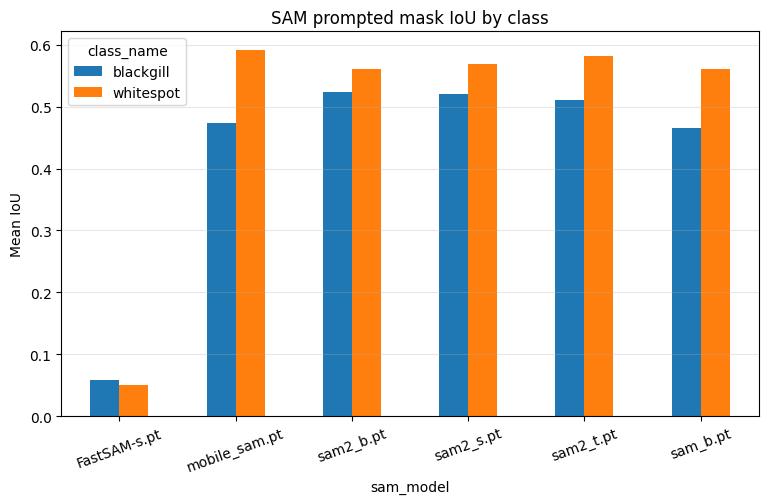

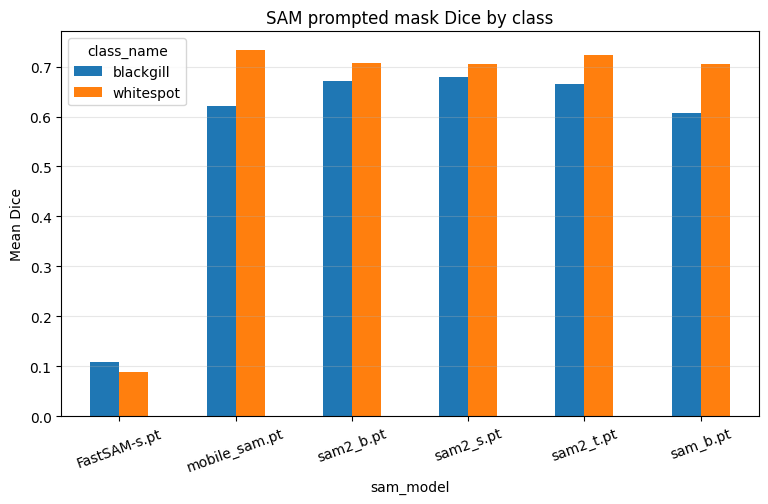

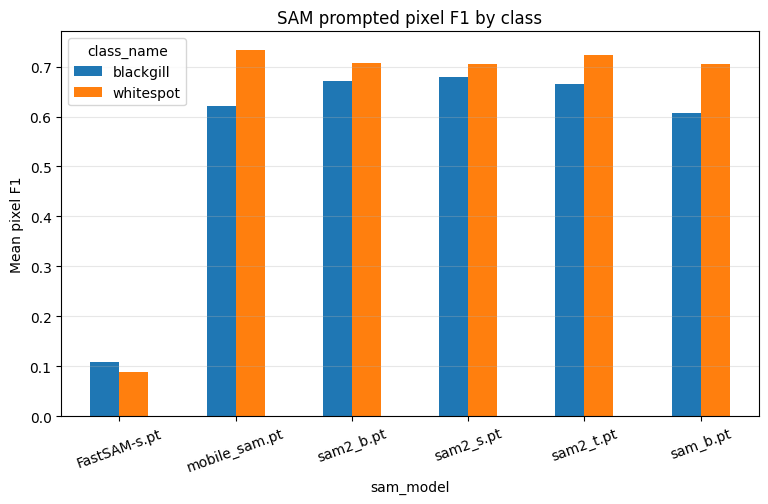

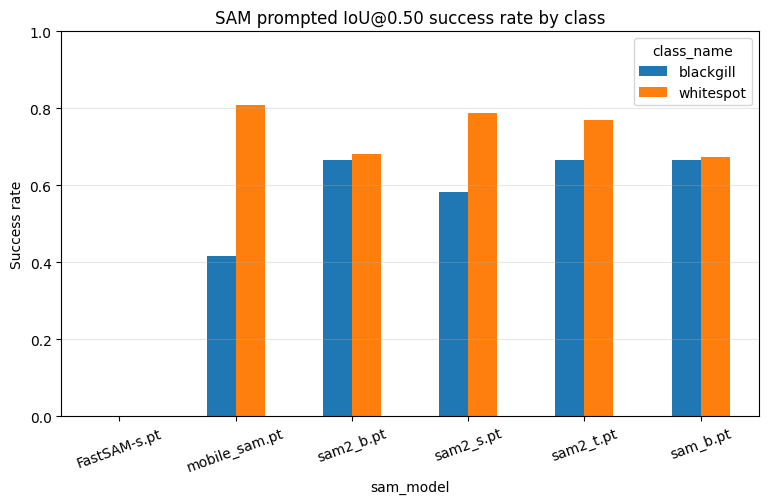

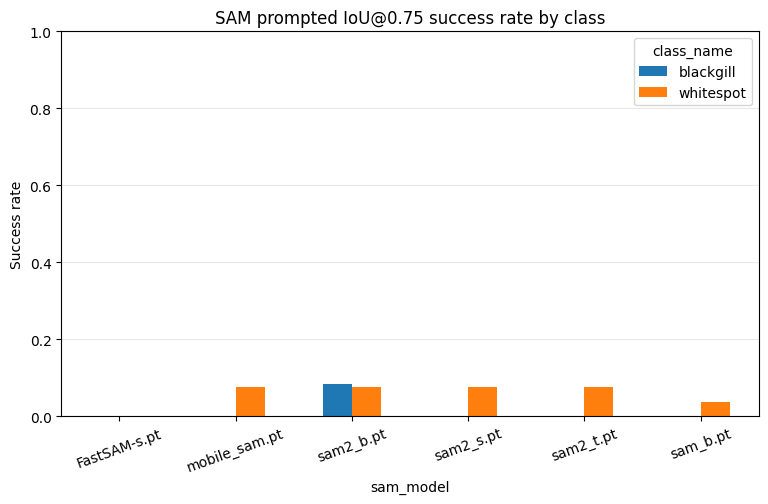

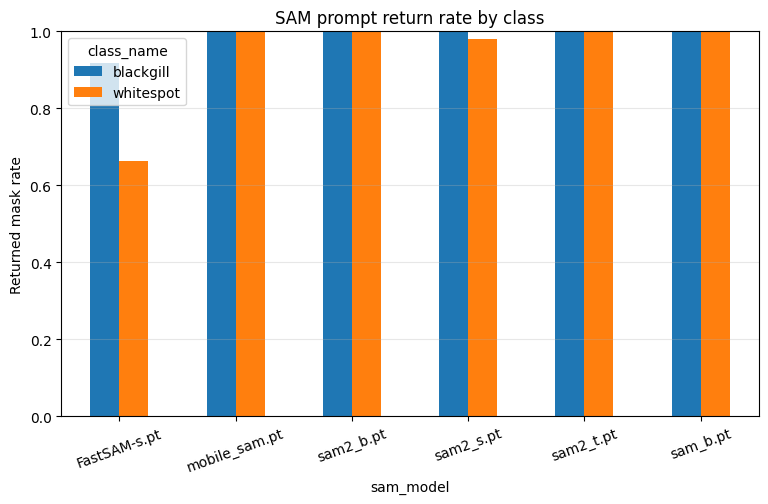

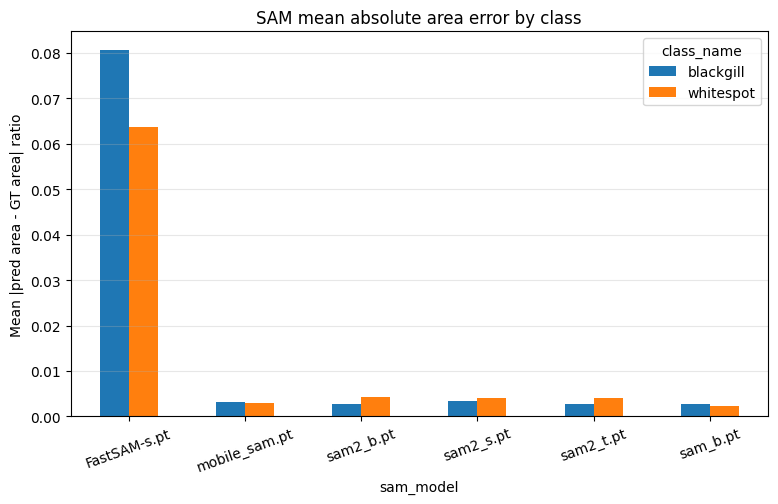

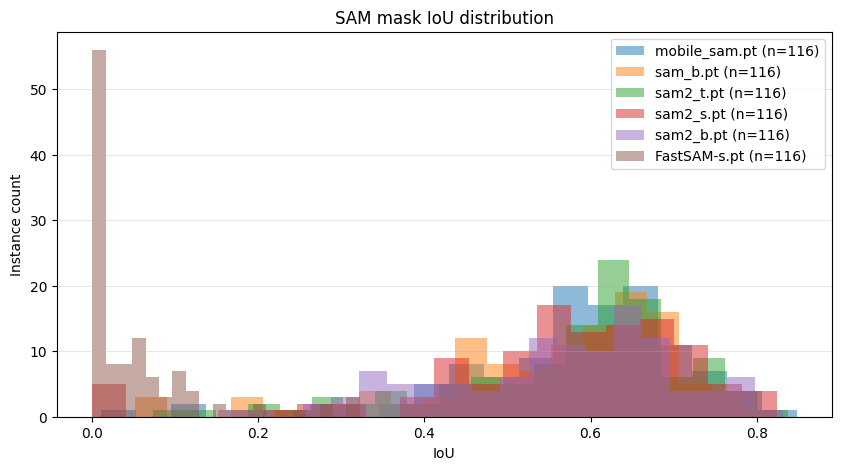

sam_model
FastSAM-s.pt      66.130562
mobile_sam.pt     94.314403
sam2_t.pt        111.766018
sam2_s.pt        124.527333
sam2_b.pt        185.965785
sam_b.pt         243.872803
Name: runtime_ms_per_instance, dtype: float64

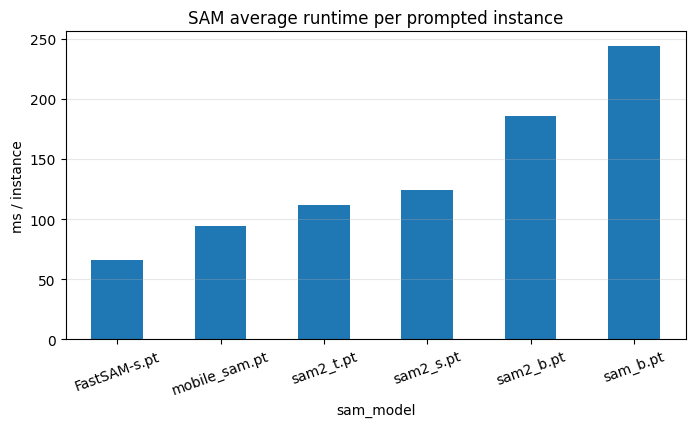

In [14]:

if len(sam_inst_all) > 0:
    # Mean IoU by model/class
    pivot_iou = sam_inst_all.groupby(['sam_model', 'class_name'])['mask_iou'].mean().unstack(fill_value=0)
    display(pivot_iou)

    pivot_iou.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompted mask IoU by class')
    plt.ylabel('Mean IoU')
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # Dice
    pivot_dice = sam_inst_all.groupby(['sam_model', 'class_name'])['mask_dice'].mean().unstack(fill_value=0)
    pivot_dice.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompted mask Dice by class')
    plt.ylabel('Mean Dice')
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # Pixel F1
    pivot_f1 = sam_inst_all.groupby(['sam_model', 'class_name'])['pixel_f1'].mean().unstack(fill_value=0)
    pivot_f1.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompted pixel F1 by class')
    plt.ylabel('Mean pixel F1')
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # IoU success rates
    pivot_iou50 = sam_inst_all.groupby(['sam_model', 'class_name'])['iou50_success'].mean().unstack(fill_value=0)
    pivot_iou50.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompted IoU@0.50 success rate by class')
    plt.ylabel('Success rate')
    plt.ylim(0, 1)
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    pivot_iou75 = sam_inst_all.groupby(['sam_model', 'class_name'])['iou75_success'].mean().unstack(fill_value=0)
    pivot_iou75.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompted IoU@0.75 success rate by class')
    plt.ylabel('Success rate')
    plt.ylim(0, 1)
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # Prompt return rate
    pivot_return = sam_inst_all.groupby(['sam_model', 'class_name'])['returned_mask'].mean().unstack(fill_value=0)
    pivot_return.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM prompt return rate by class')
    plt.ylabel('Returned mask rate')
    plt.ylim(0, 1)
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # Area error
    pivot_area_err = sam_inst_all.groupby(['sam_model', 'class_name'])['area_abs_error'].mean().unstack(fill_value=0)
    pivot_area_err.plot(kind='bar', figsize=(9, 5))
    plt.title('SAM mean absolute area error by class')
    plt.ylabel('Mean |pred area - GT area| ratio')
    plt.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=20)
    plt.show()

    # IoU distribution by model
    plt.figure(figsize=(10, 5))
    for model_name in sam_inst_all['sam_model'].unique():
        vals = sam_inst_all[sam_inst_all['sam_model'] == model_name]['mask_iou'].values
        plt.hist(vals, bins=20, alpha=0.5, label=f'{model_name} (n={len(vals)})')
    plt.title('SAM mask IoU distribution')
    plt.xlabel('IoU')
    plt.ylabel('Instance count')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.show()

    # Runtime comparison
    if 'runtime_ms_per_instance' in sam_inst_all.columns:
        runtime_inst = sam_inst_all.groupby('sam_model')['runtime_ms_per_instance'].mean().sort_values()
        display(runtime_inst)
        runtime_inst.plot(kind='bar', figsize=(8, 4))
        plt.title('SAM average runtime per prompted instance')
        plt.ylabel('ms / instance')
        plt.grid(axis='y', alpha=0.3)
        plt.xticks(rotation=20)
        plt.show()
else:
    print('No results to plot.')


## 14. Hiển thị 5 ảnh prediction của SAM

Ultralytics lưu ảnh prediction trong `SAM_RUNS_DIR/<run_name>/`.

Prediction samples for: mobile_sam.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


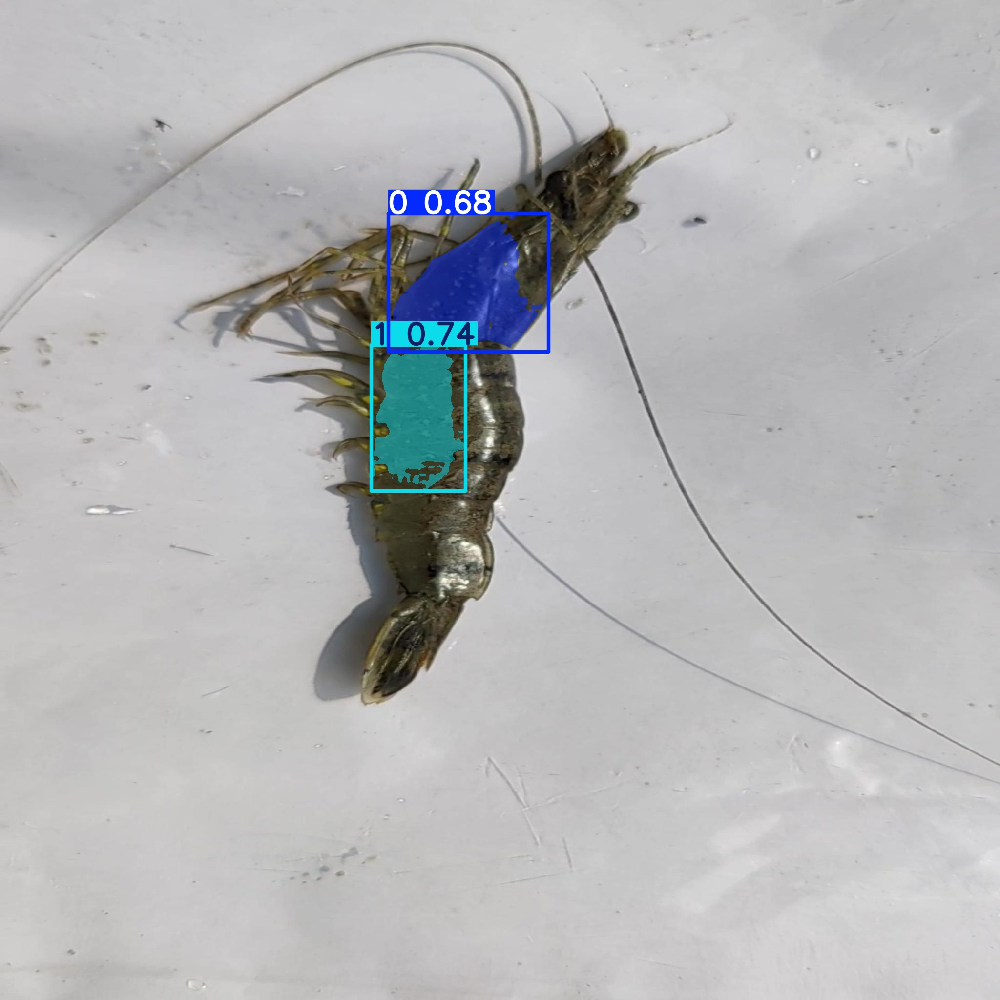

/kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


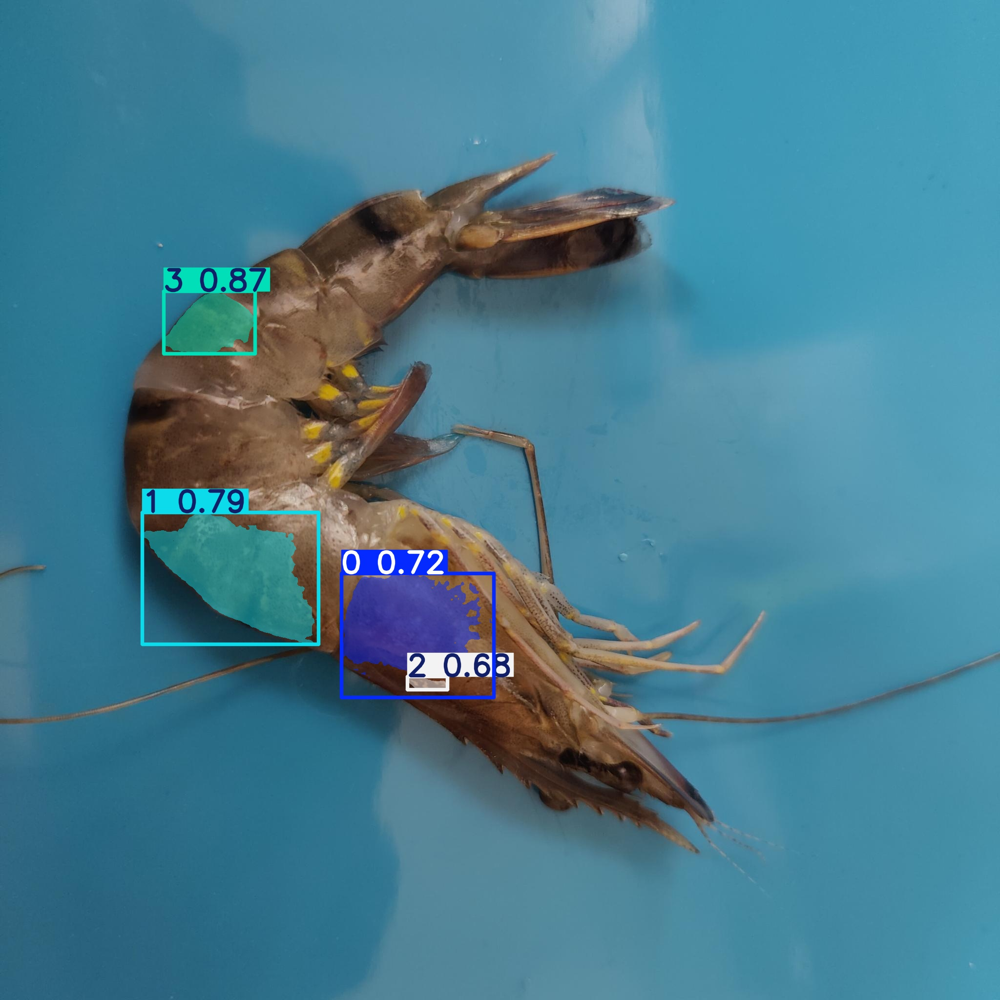

/kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


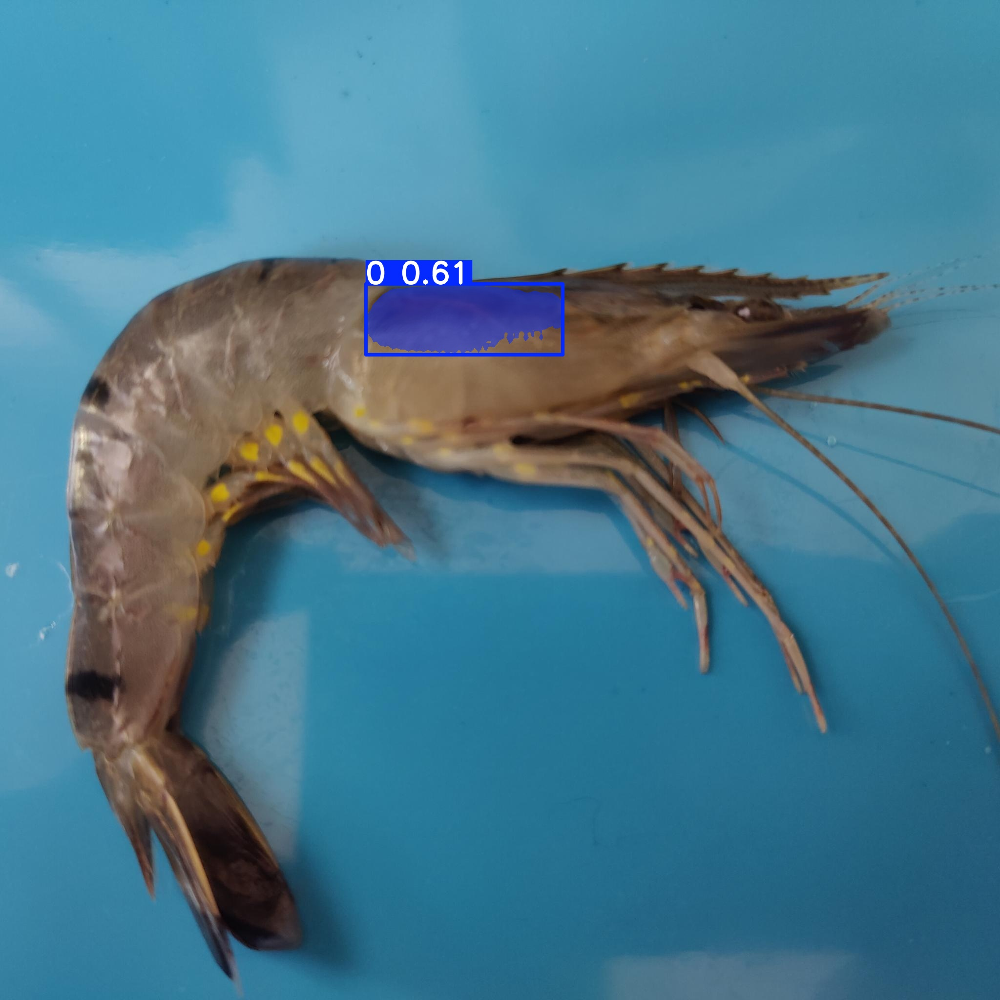

/kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


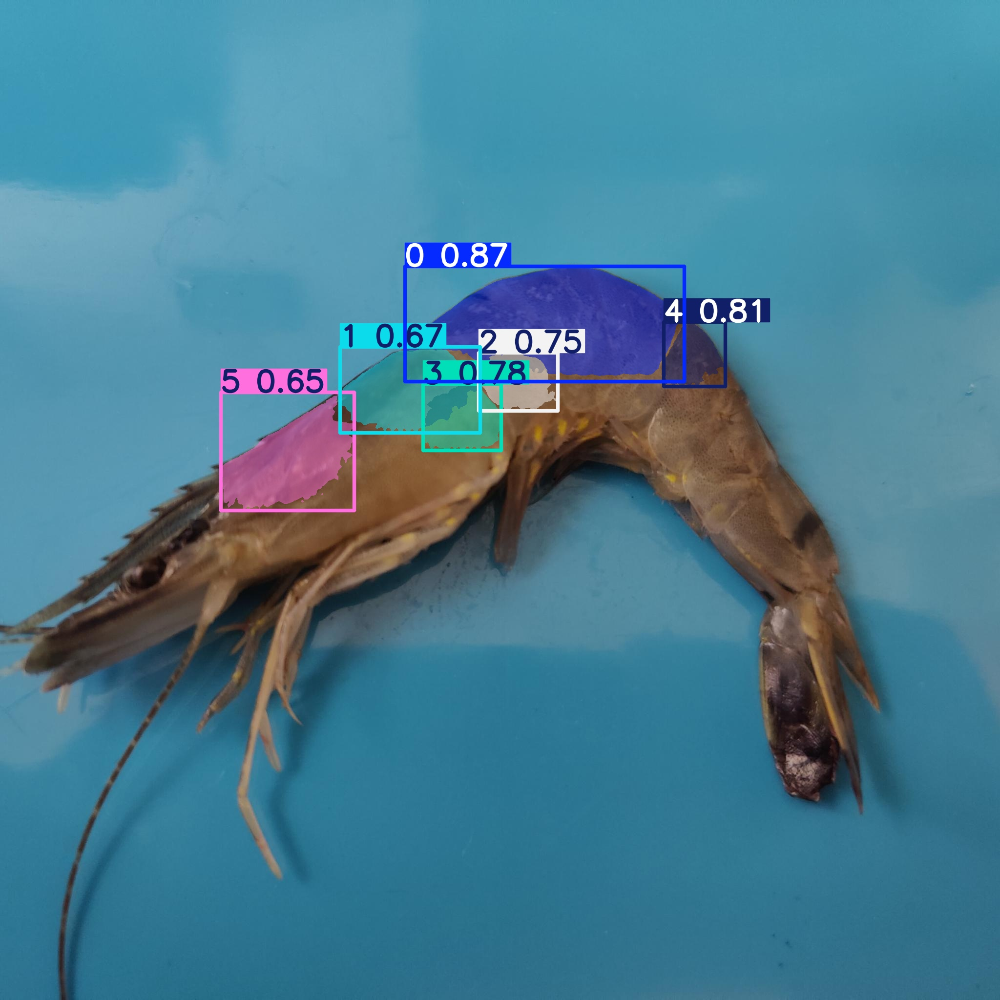

/kaggle/working/shrimp_yolo_outputs/sam_runs/mobile_sam_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


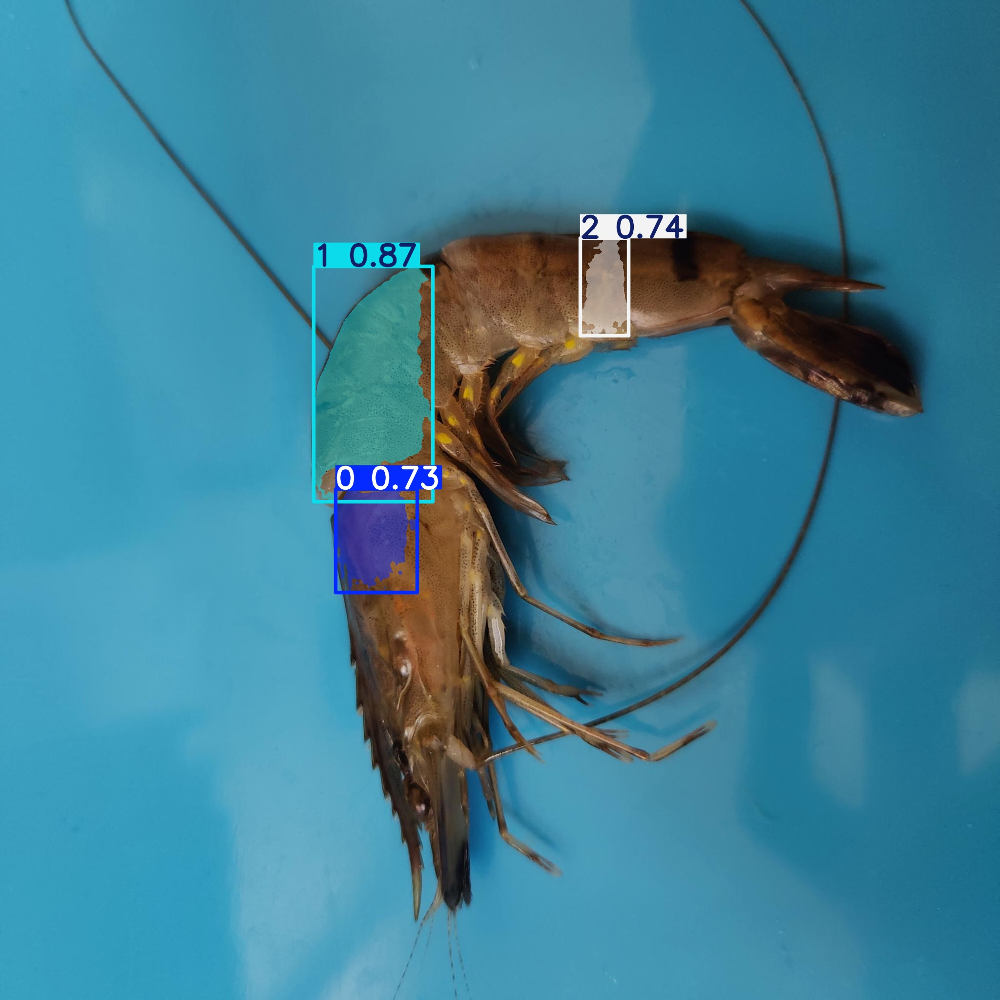

Prediction samples for: sam_b.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


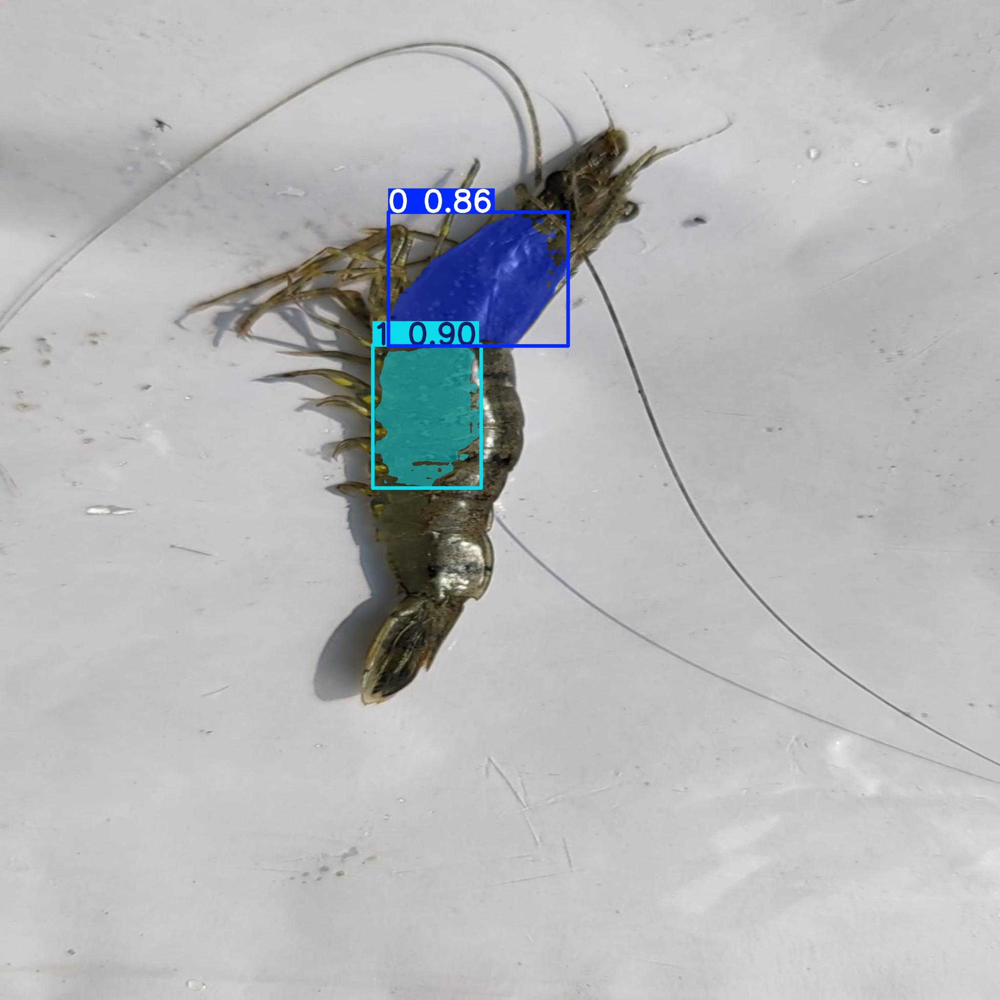

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


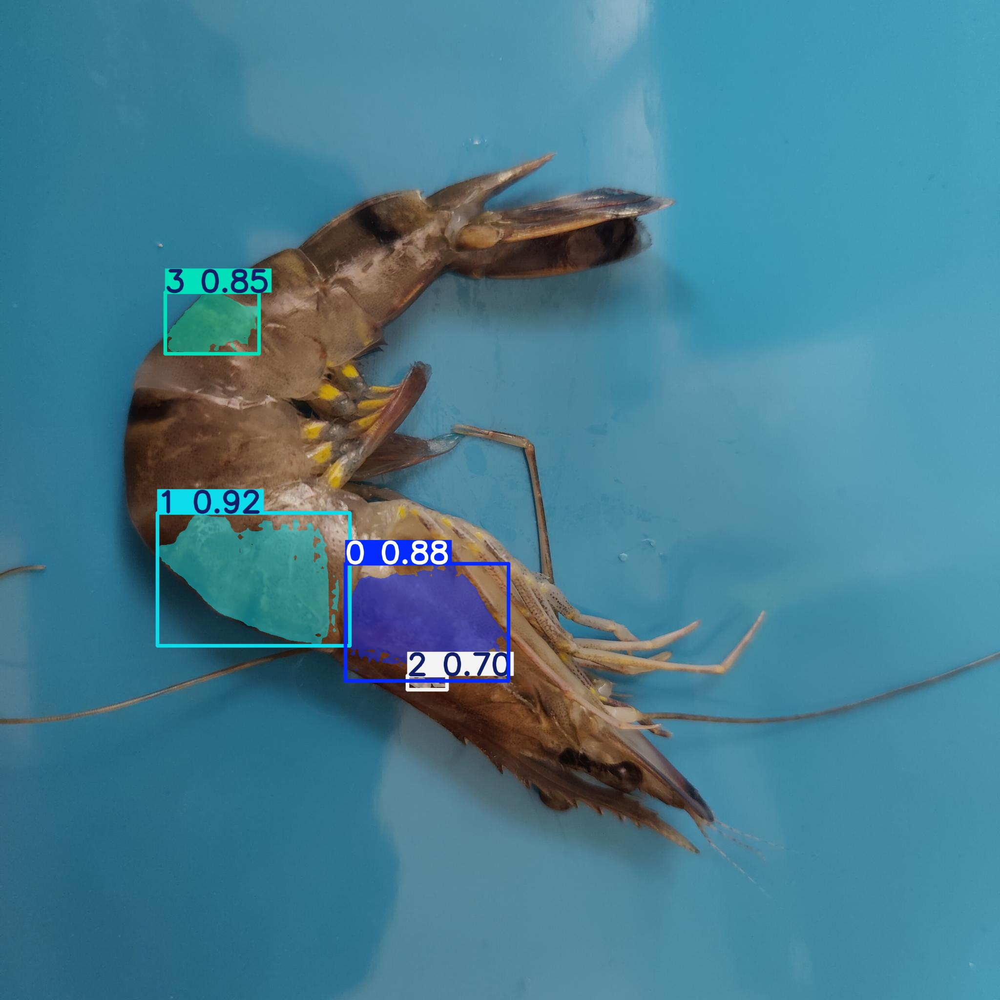

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


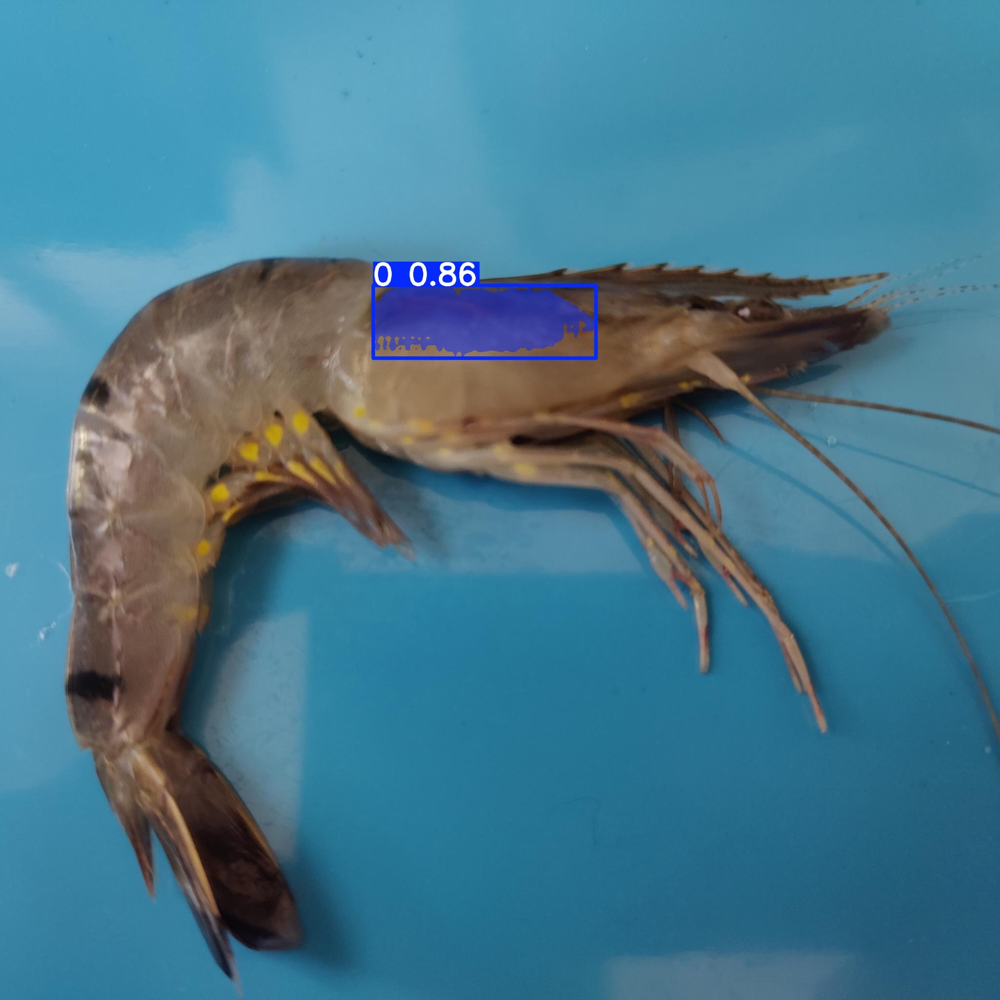

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


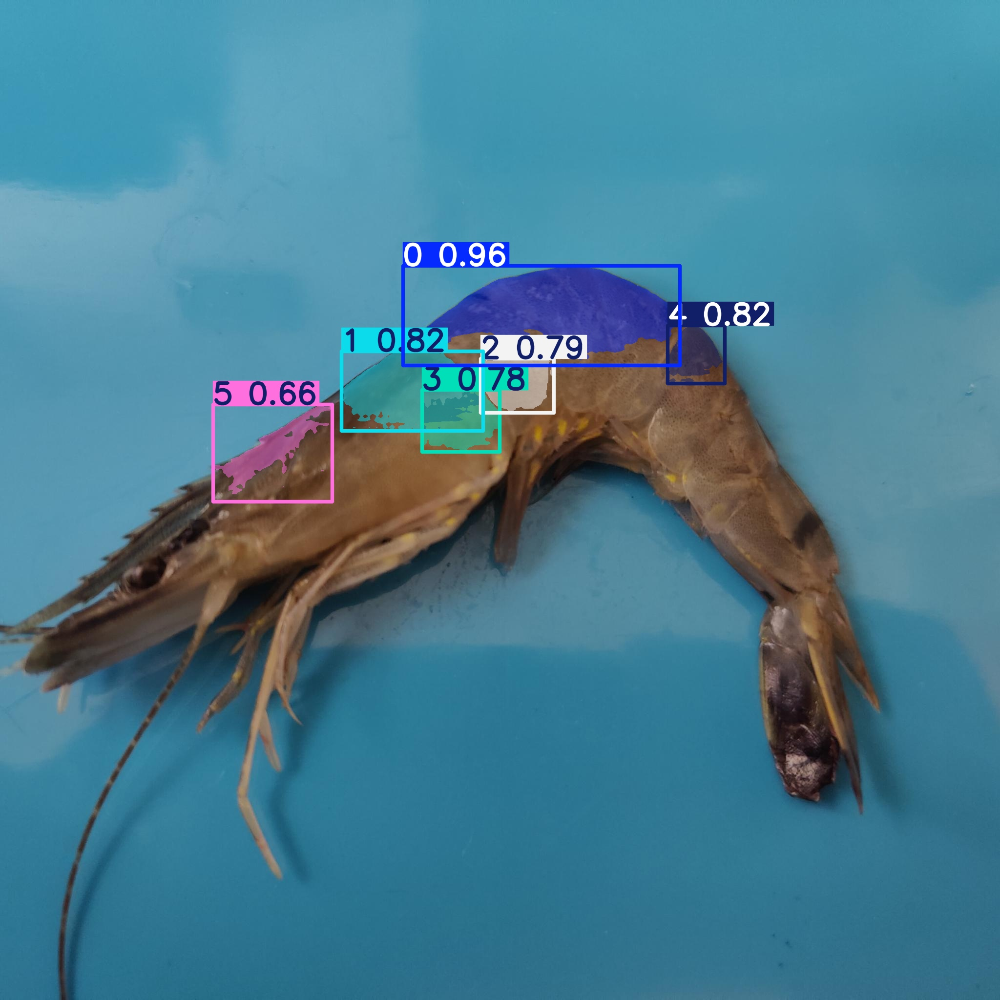

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam_b_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


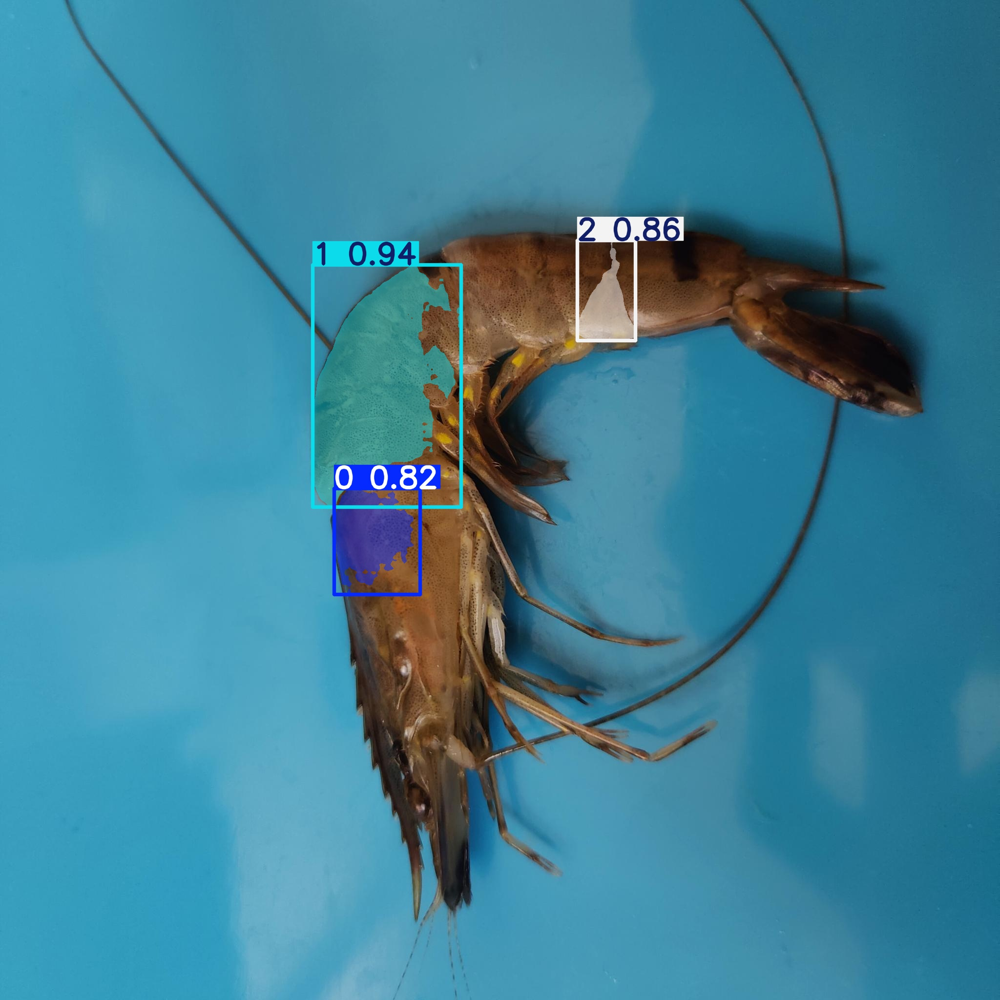

Prediction samples for: sam2_t.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


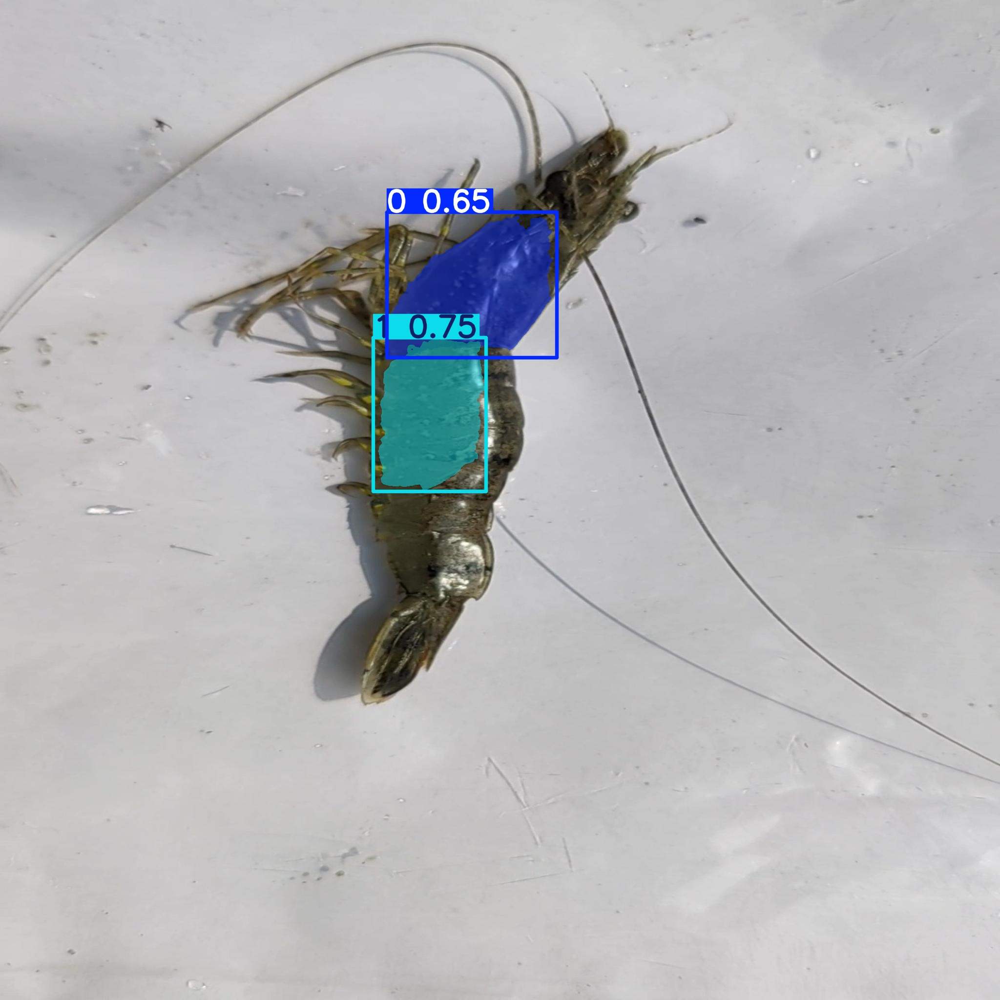

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


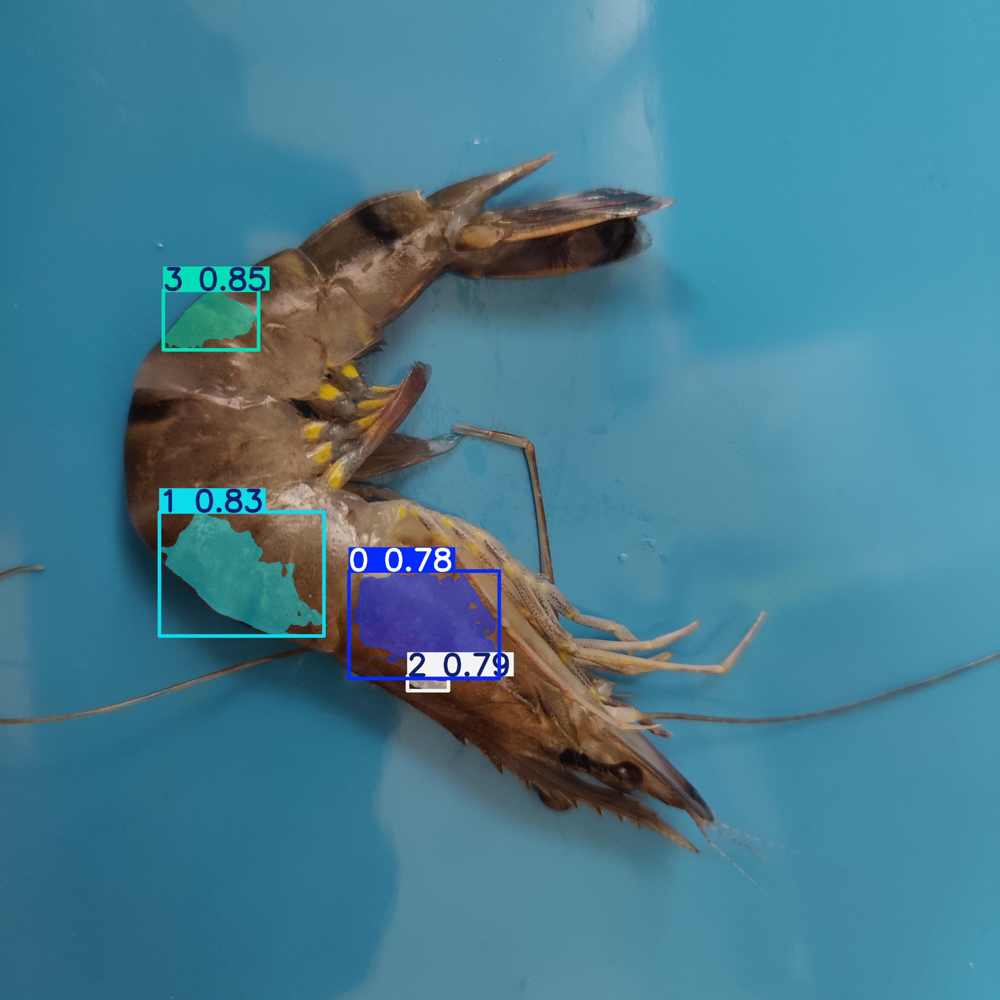

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


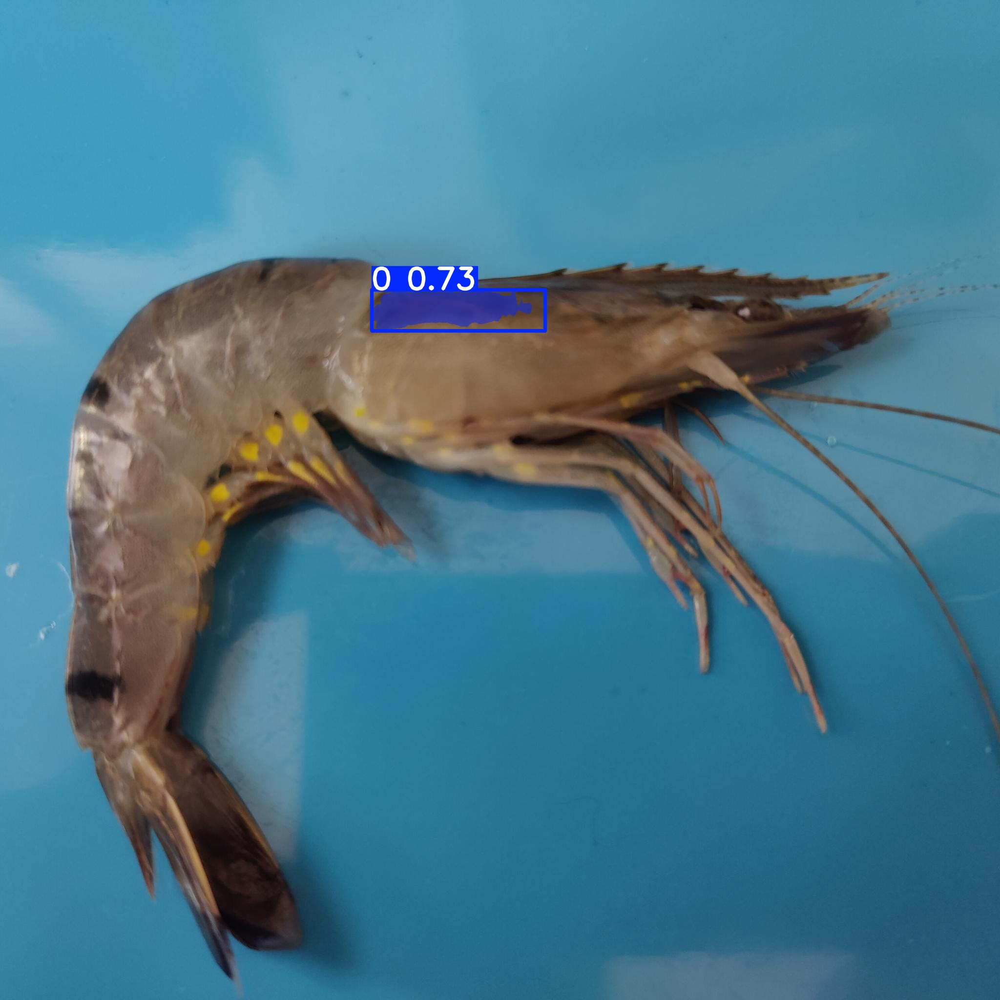

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


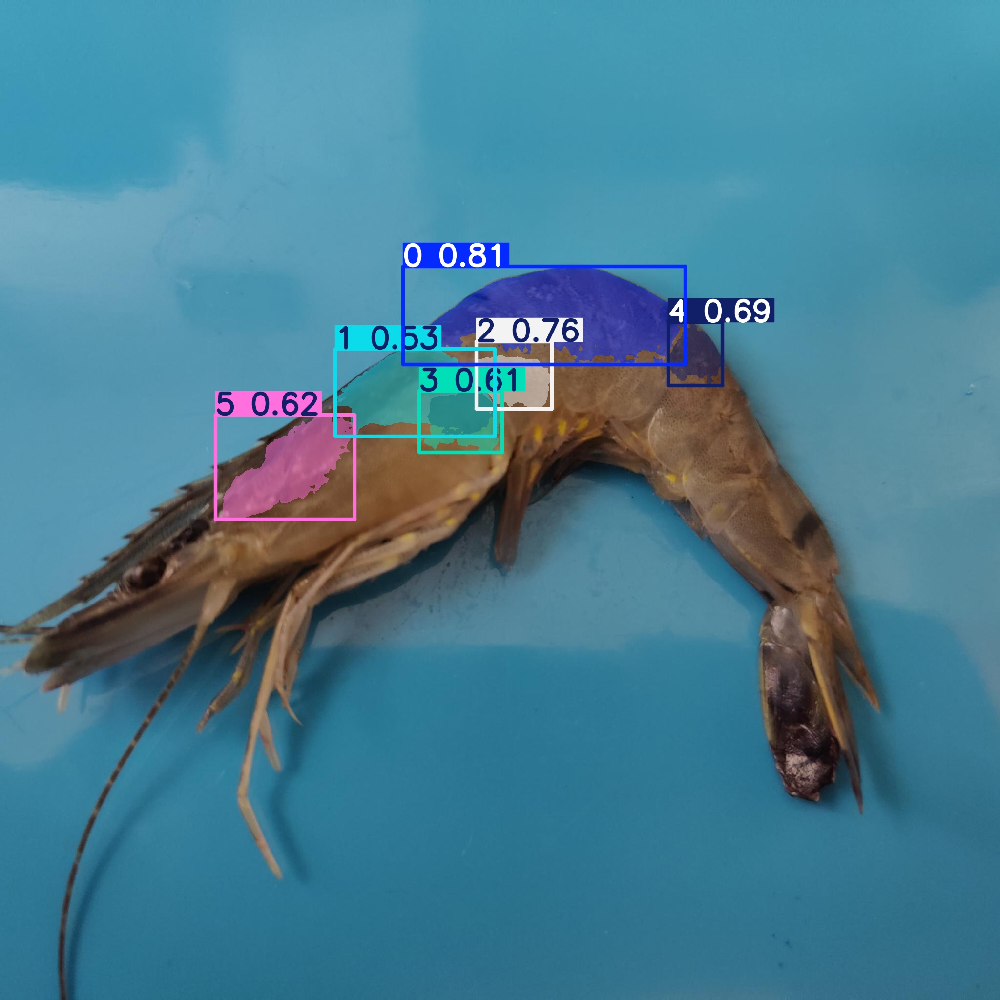

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_t_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


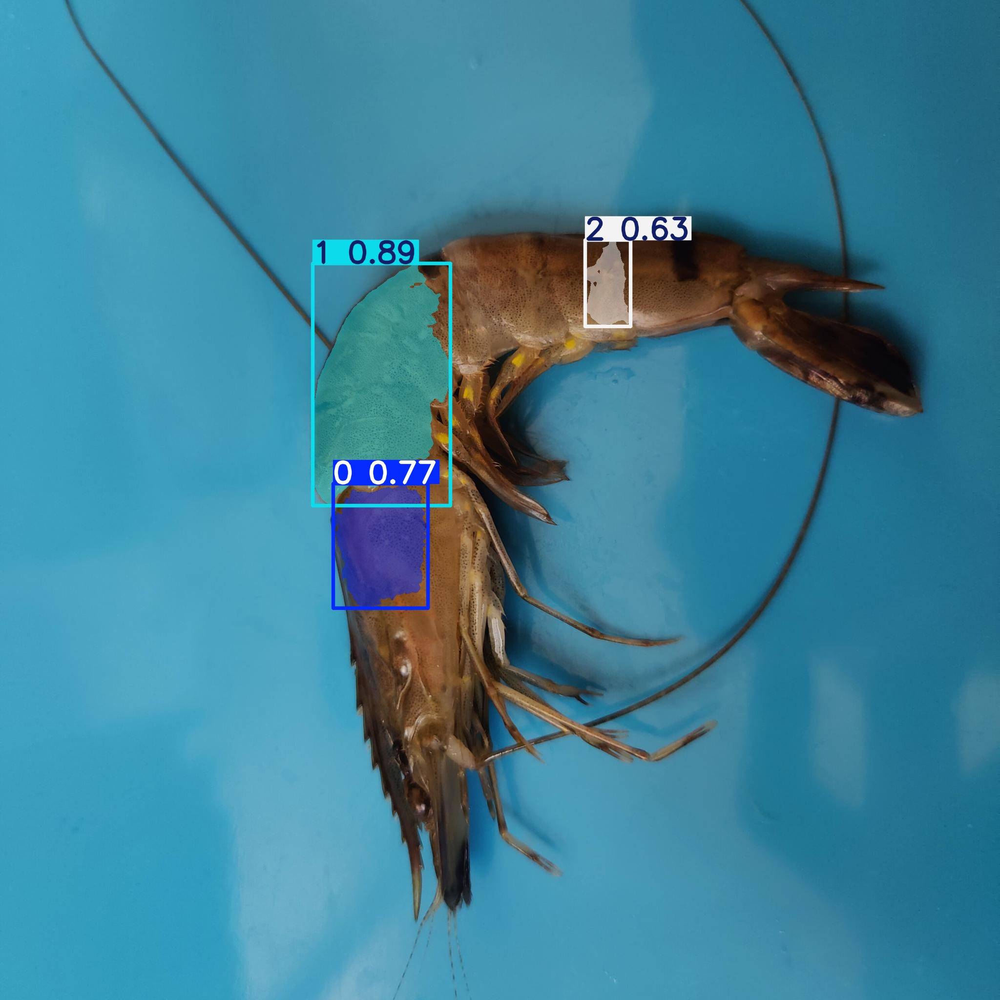

Prediction samples for: sam2_s.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


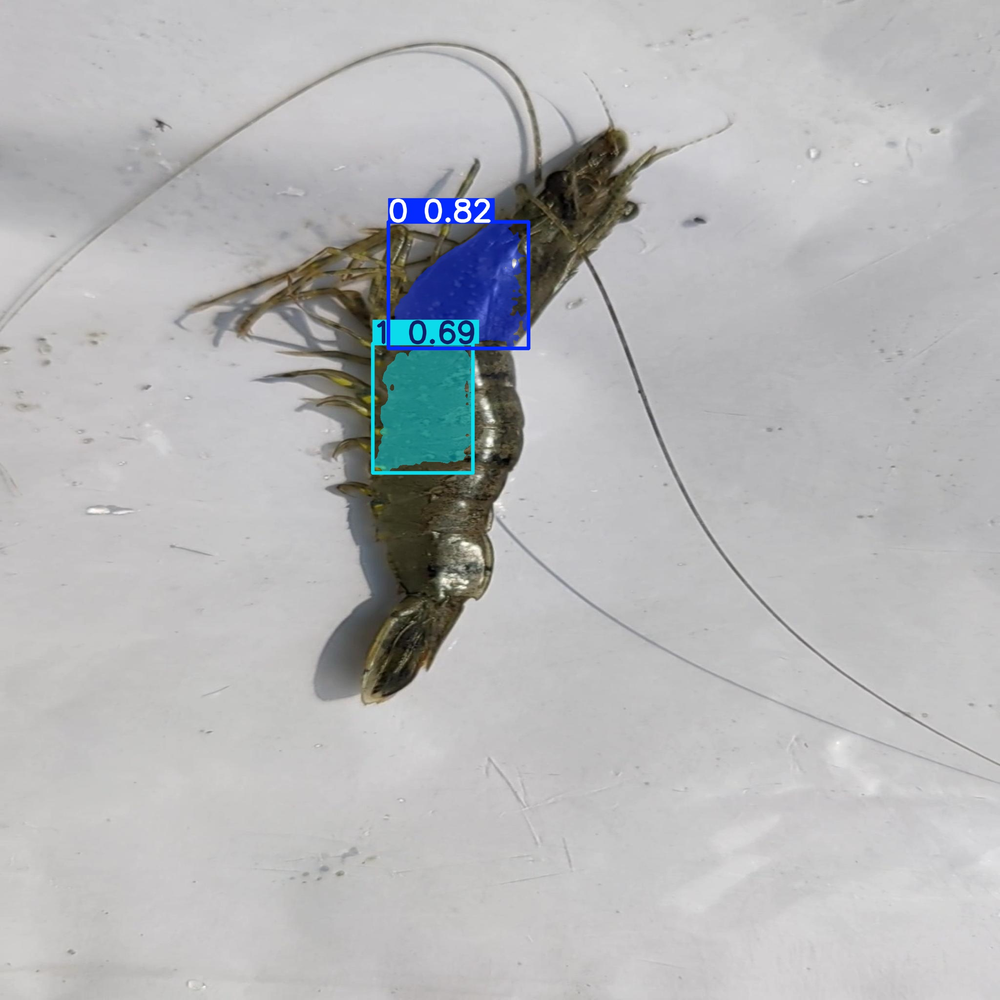

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


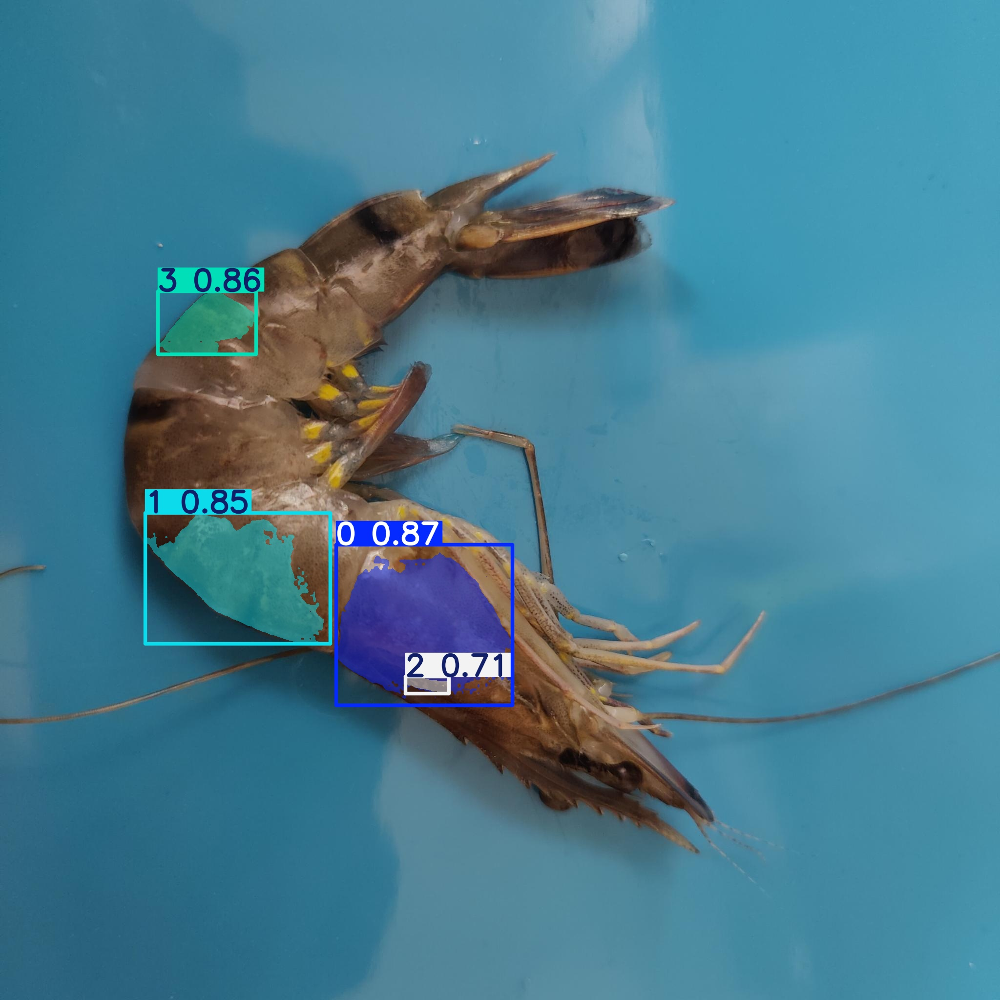

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


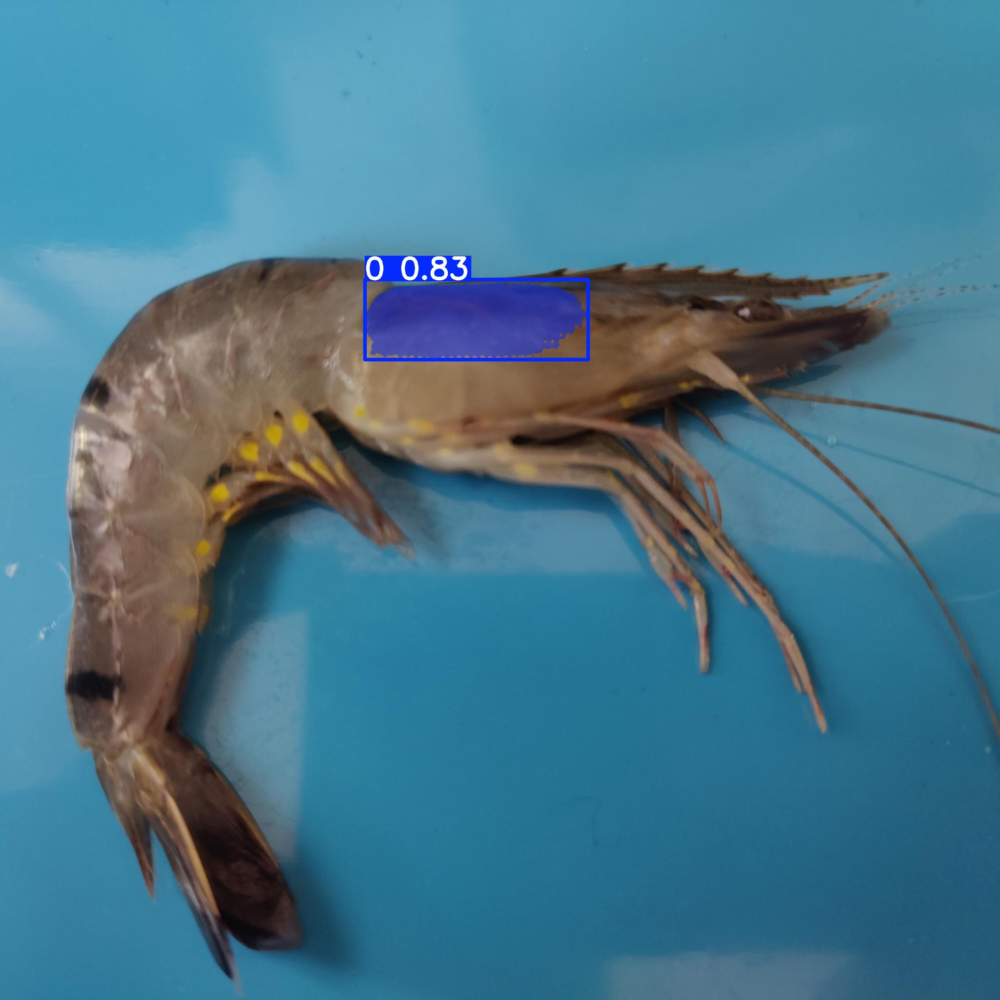

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


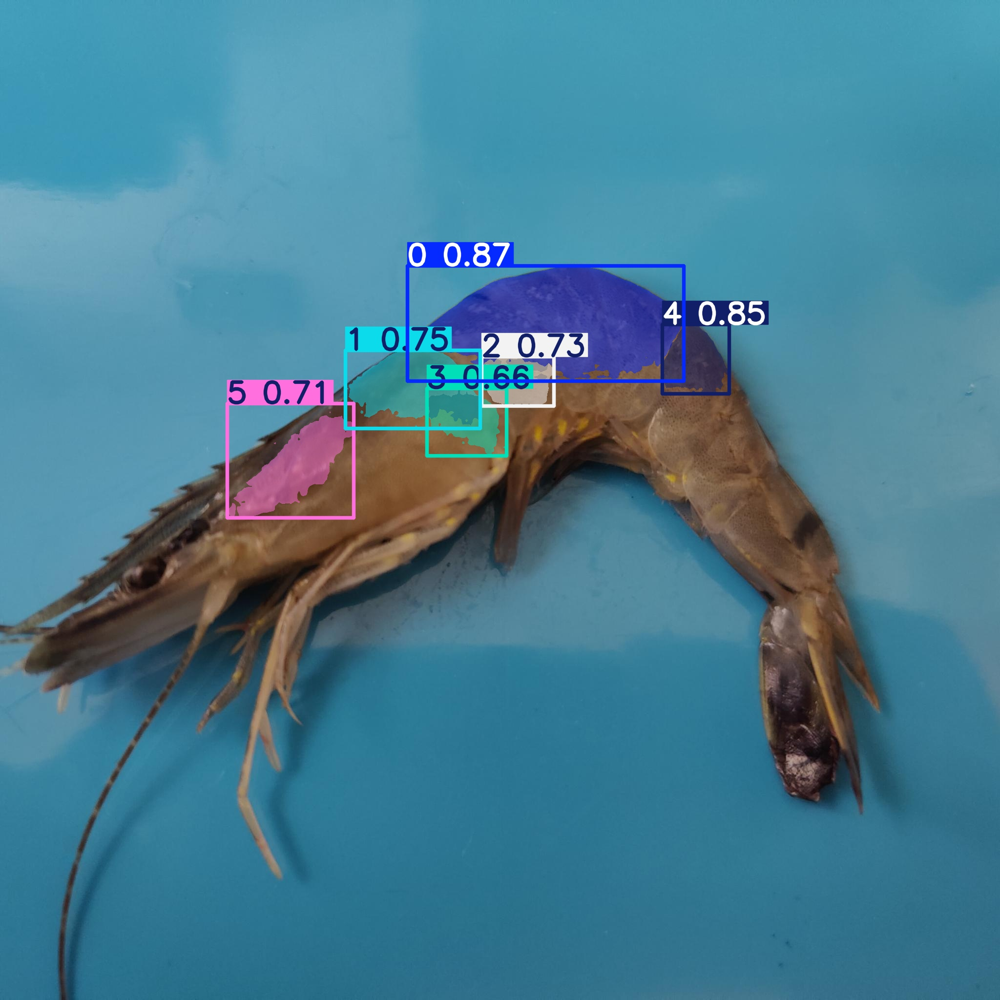

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_s_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


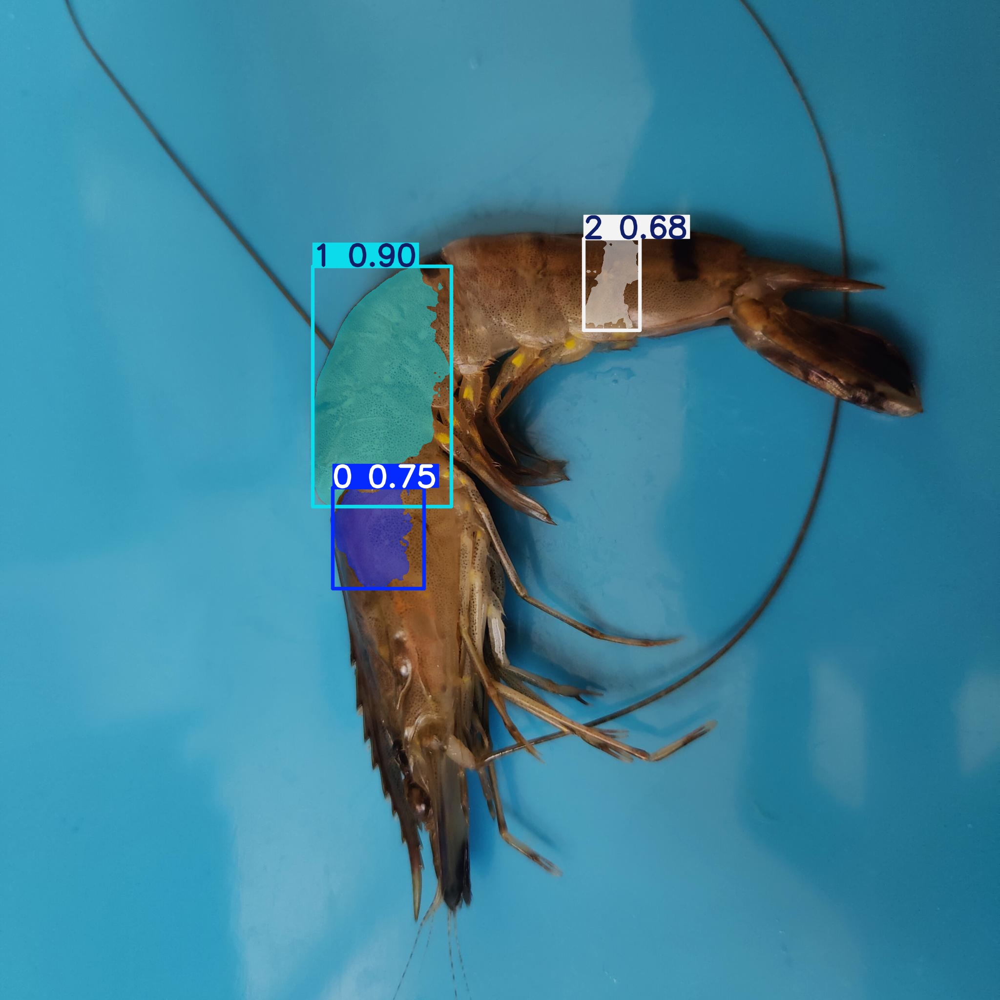

Prediction samples for: sam2_b.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


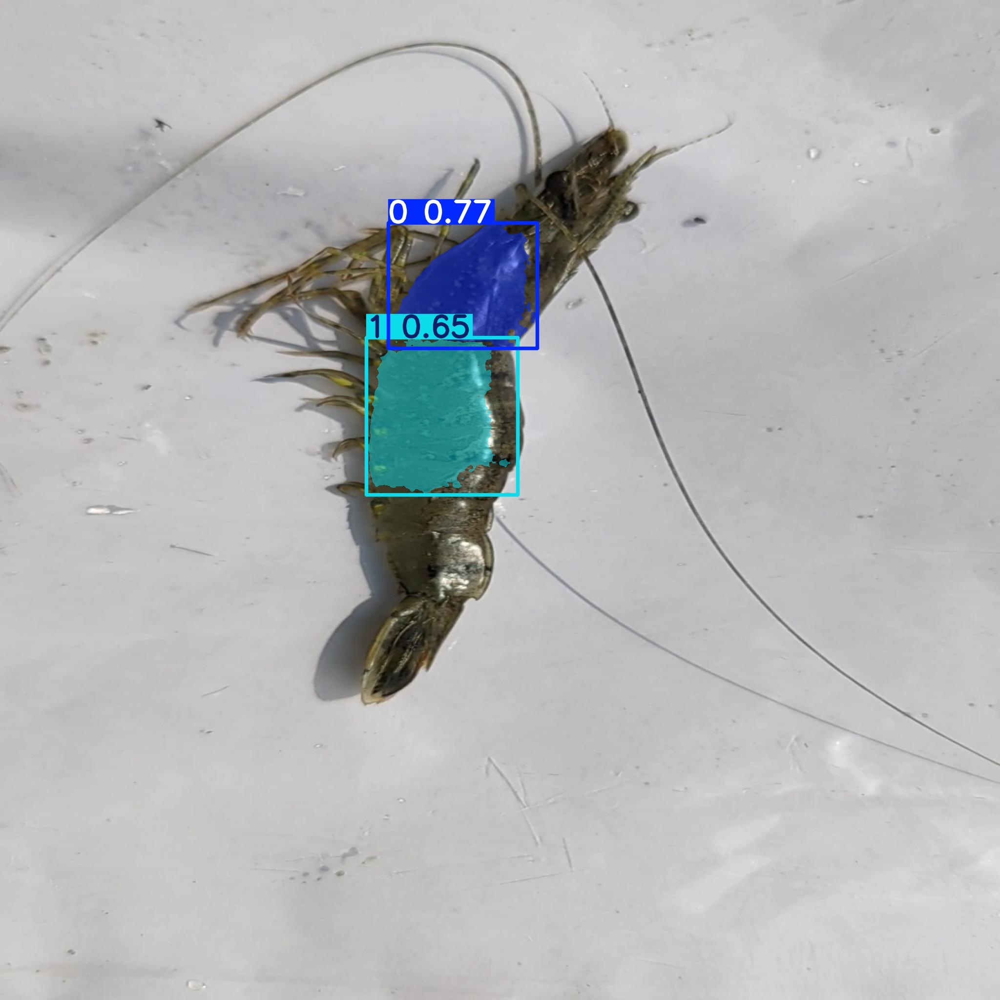

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


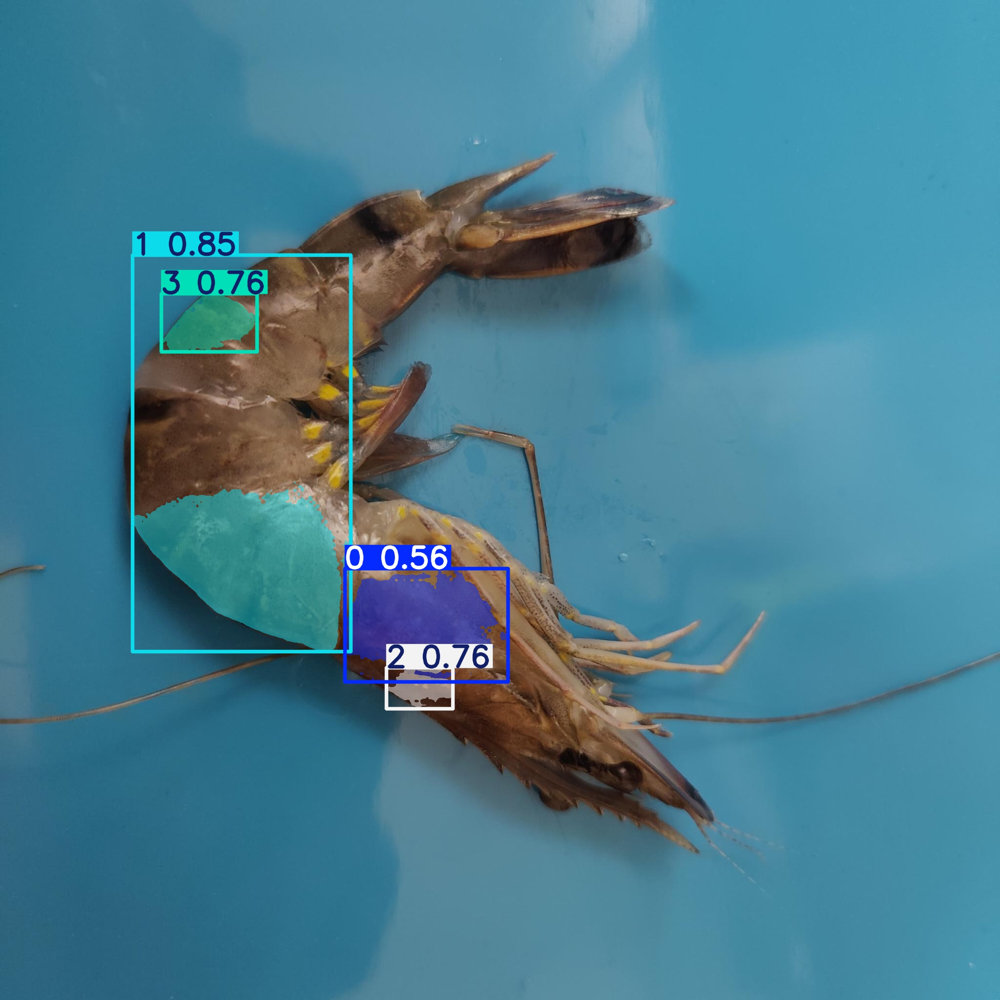

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


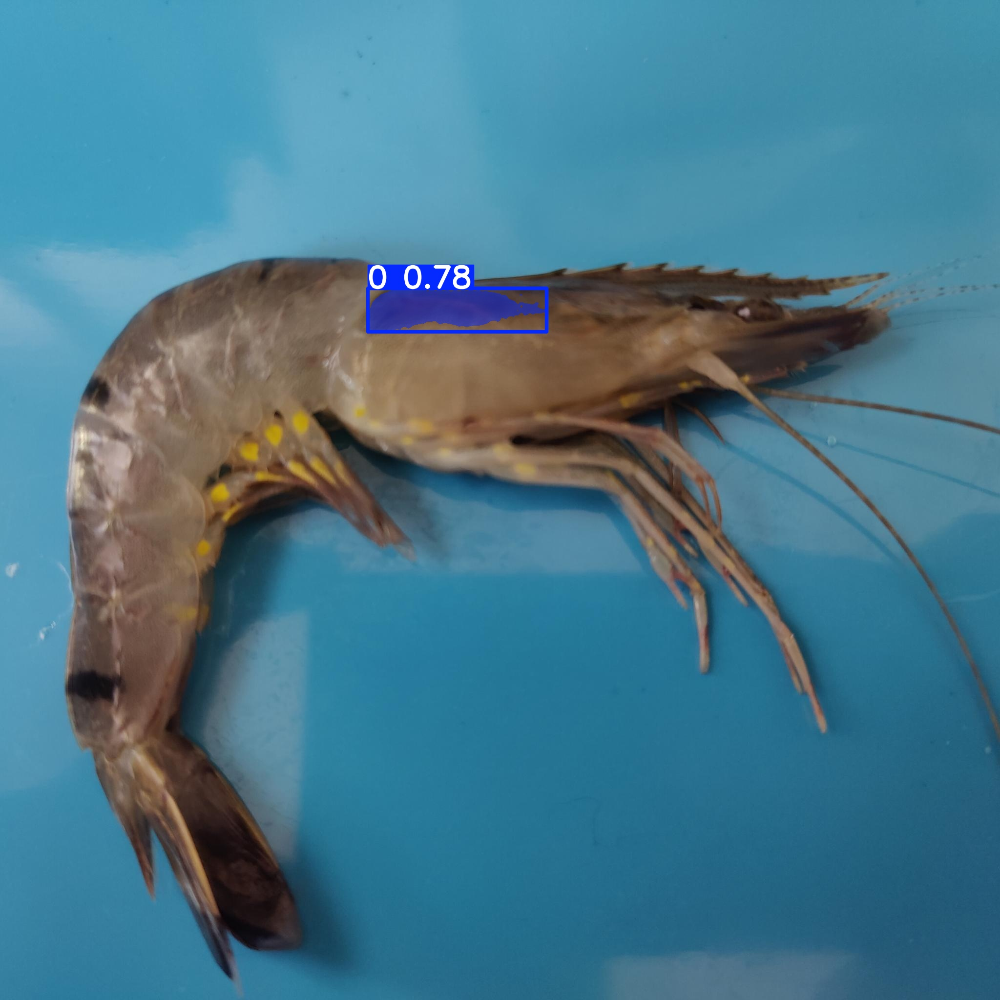

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


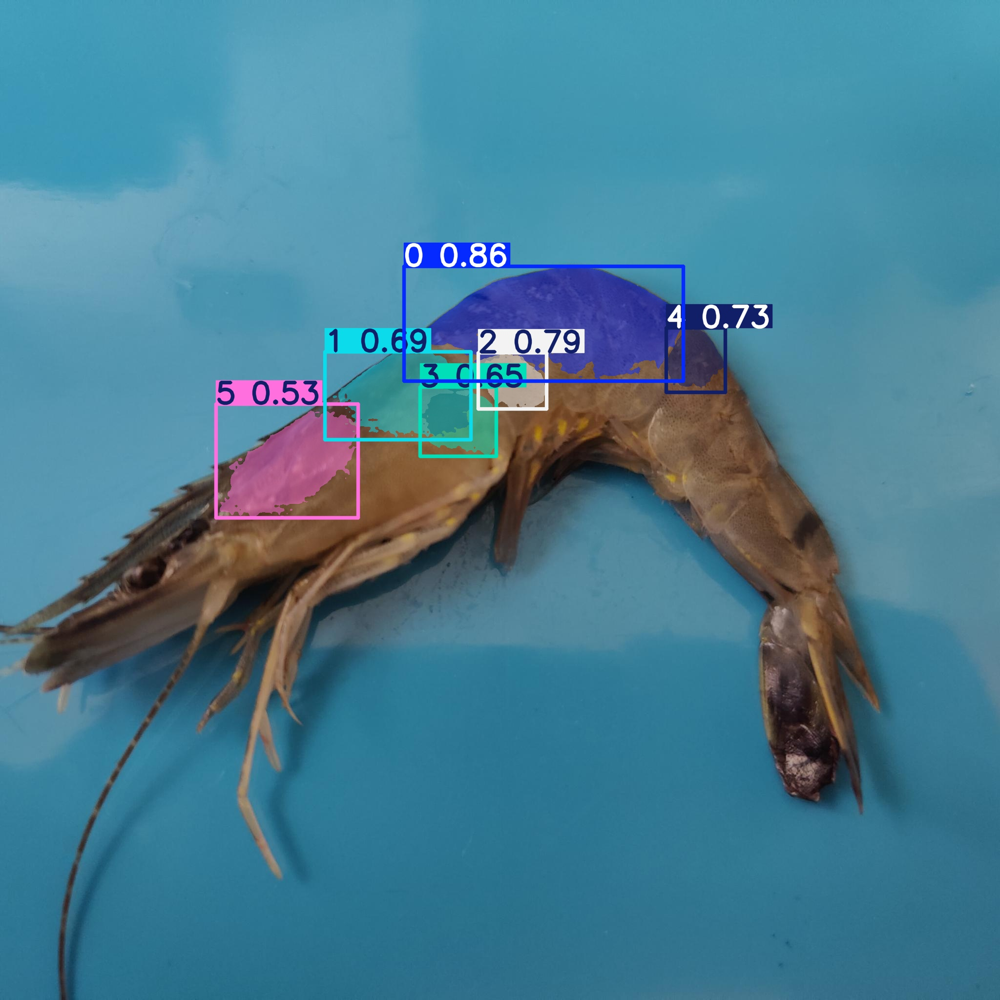

/kaggle/working/shrimp_yolo_outputs/sam_runs/sam2_b_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


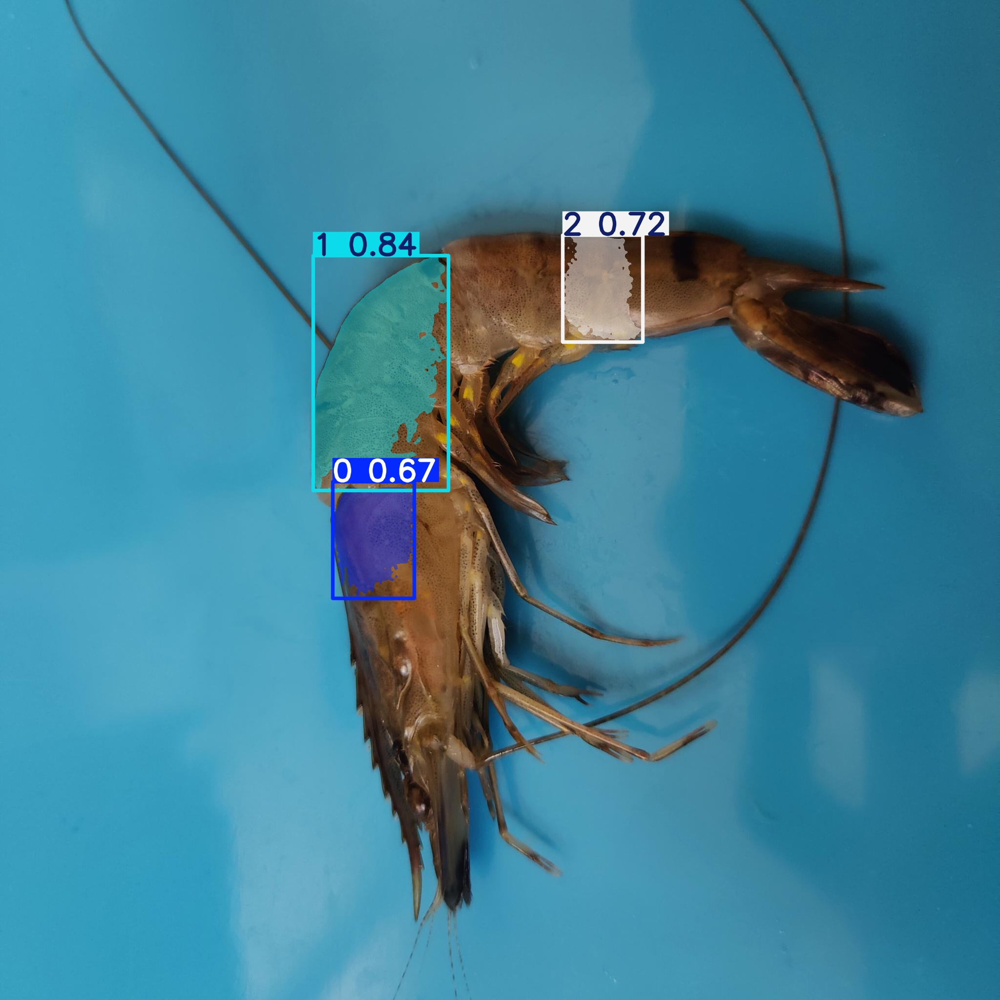

Prediction samples for: FastSAM-s.pt
Found prediction images: 5
/kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox/Shrimp_326-3-_jpg.rf.8dd585c4670664d46095873cec6e0f5a.jpg


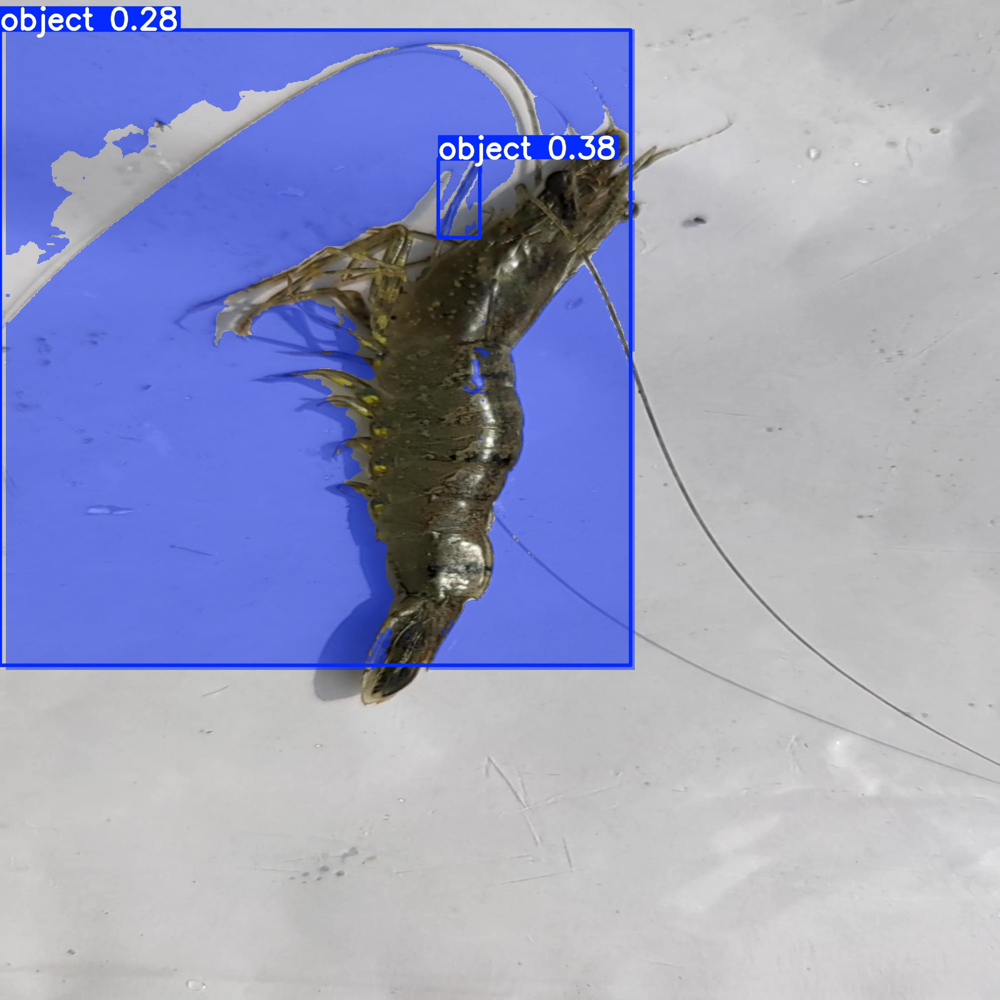

/kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox/Shrimp_329-2-_jpg.rf.70b309aa90ebf560767c14ba5e5fda93.jpg


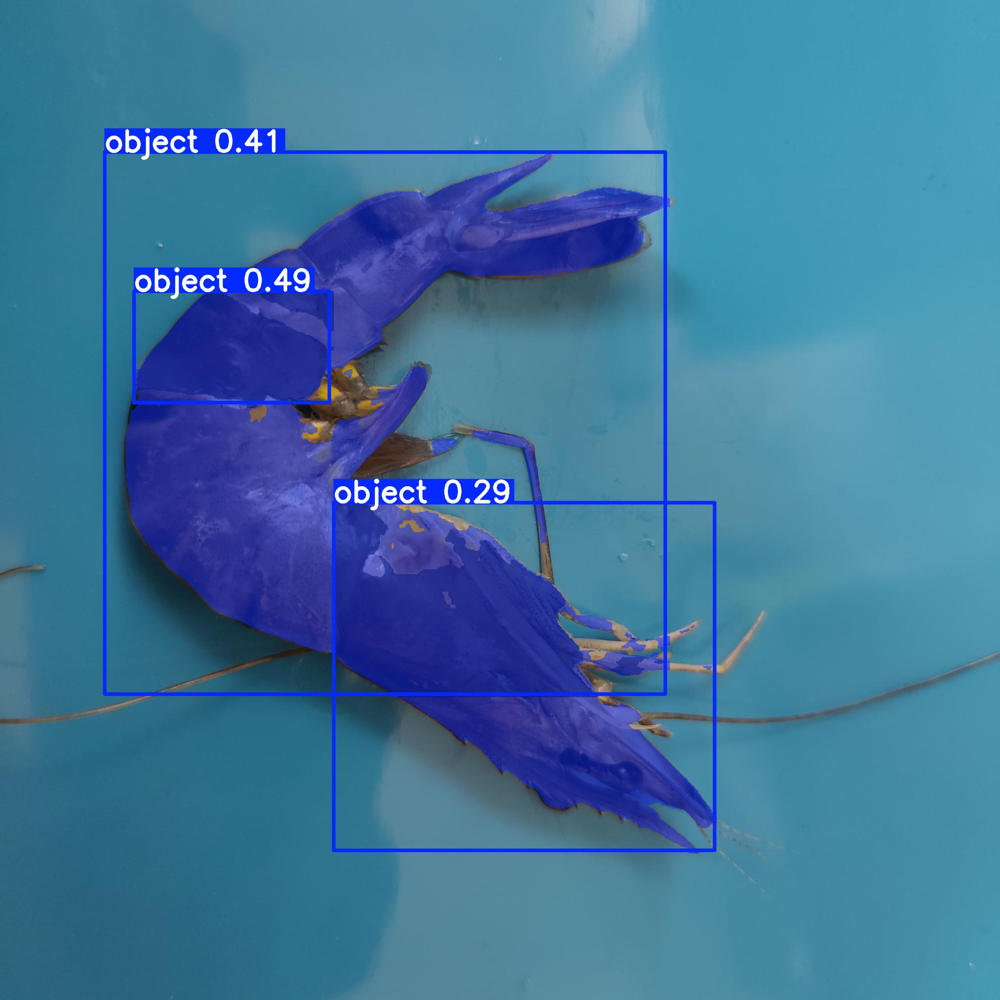

/kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox/Shrimp_334-2-_jpg.rf.abcee567b1b91183b378b88ce2f98e24.jpg


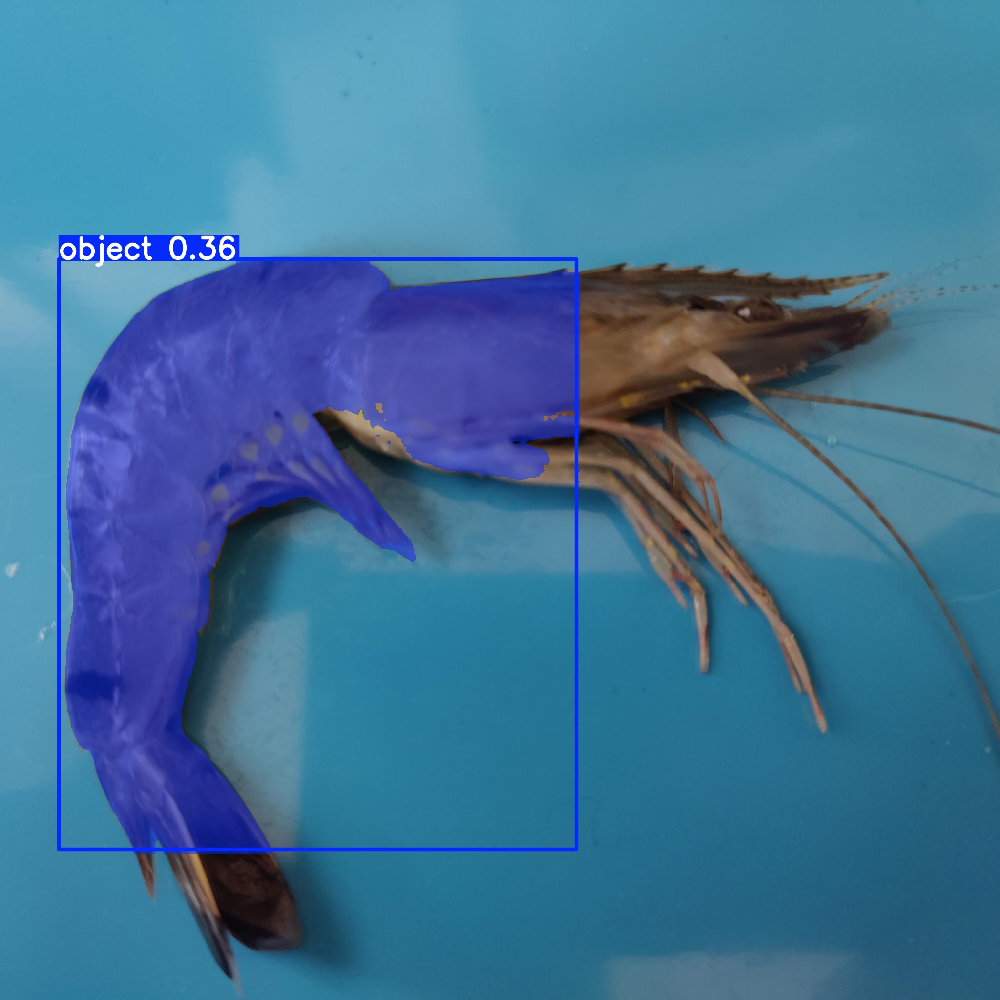

/kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox/Shrimp_337-3-_jpg.rf.c724b534c6bf80005fa9f4a845fe9d15.jpg


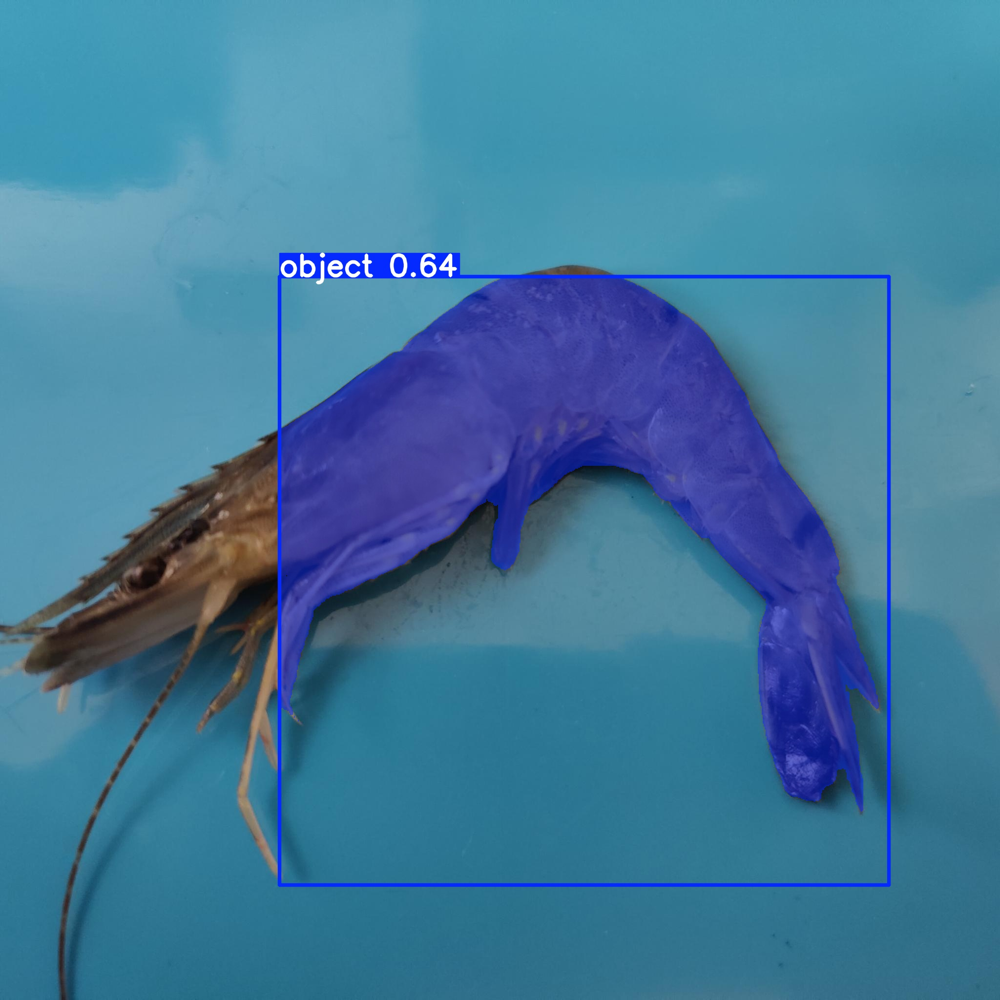

/kaggle/working/shrimp_yolo_outputs/sam_runs/FastSAM-s_test_gtbox/Shrimp_342-2-_jpg.rf.ad04613a57442cbaf1b3d19d6f0f4d84.jpg


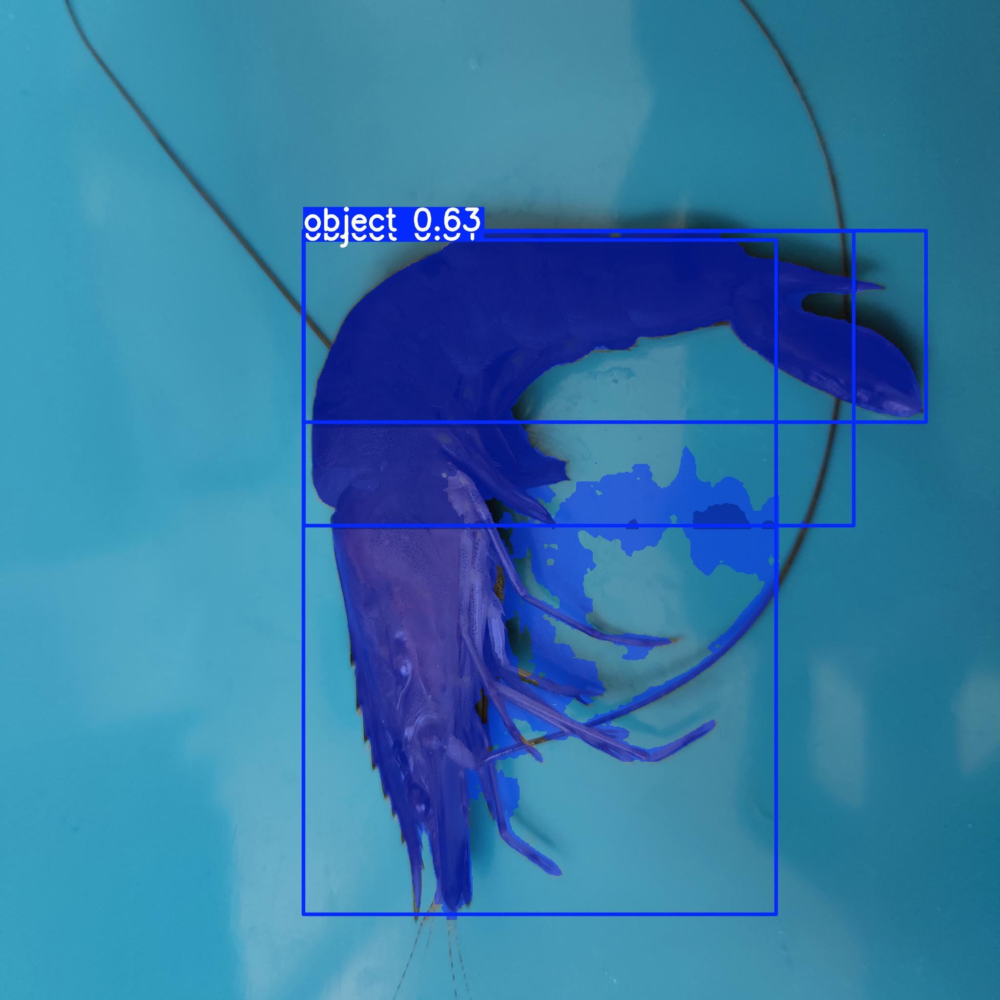

In [16]:

from IPython.display import display, Image

def show_sample_prediction_images(run_root, max_images=5):
    run_root = Path(run_root)
    candidates = []
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        candidates.extend(list(run_root.rglob(ext)))
    # Avoid showing source images if any; show saved predictions under model folders
    candidates = sorted(candidates)[:max_images]
    print('Found prediction images:', len(candidates))
    for p in candidates:
        print(p)
        display(Image(filename=str(p)))

for model_name in available_sam_models:
    run_name = f'{model_name.replace(".pt", "")}_{SAM_EVAL_SPLIT}_gtbox'
    run_dir = SAM_RUNS_DIR / run_name
    print('' + '=' * 80)
    print('Prediction samples for:', model_name)
    print('=' * 80)
    show_sample_prediction_images(run_dir, max_images=5)

## 15. Optional: YOLO boxes -> SAM mask refinement

Nếu bạn đã có YOLO `best.pt`, có thể dùng YOLO predicted boxes làm prompt cho SAM. Đây là pipeline gần thực tế hơn:

```text
YOLO predict boxes/classes -> SAM refine masks -> instance output
```

Cell dưới đây để sẵn nhưng mặc định tắt.

In [23]:

RUN_YOLO_BOX_TO_SAM = True
YOLO_BEST_PT = '/kaggle/working/shrimp_yolo_outputs/runs/your_yolo_run/weights/best.pt'

if RUN_YOLO_BOX_TO_SAM:
    from ultralytics import YOLO

    yolo_model = YOLO(YOLO_BEST_PT)
    sam_model = SAM('mobile_sam.pt')

    test_img_dir, _ = find_split_dirs(SAM_EVAL_DATASET_DIR, SAM_EVAL_SPLIT)
    image_paths = list_images(test_img_dir)[:10]

    output_dir = SAM_RUNS_DIR / 'yolo_boxes_to_mobile_sam'
    output_dir.mkdir(parents=True, exist_ok=True)

    for img_path in tqdm(image_paths):
        yolo_results = yolo_model.predict(
            source=str(img_path),
            imgsz=640,
            conf=0.15,
            iou=0.5,
            device=0,
            save=False,
            verbose=False,
        )
        if not yolo_results or yolo_results[0].boxes is None or len(yolo_results[0].boxes) == 0:
            continue

        boxes = yolo_results[0].boxes.xyxy.detach().cpu().numpy().tolist()
        sam_results = sam_model.predict(
            source=str(img_path),
            bboxes=boxes,
            imgsz=1024,
            device=0,
            save=True,
            project=str(SAM_RUNS_DIR),
            name='yolo_boxes_to_mobile_sam',
            exist_ok=True,
            verbose=False,
        )

    print('Saved YOLO-box-to-SAM predictions:', output_dir)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/shrimp_yolo_outputs/runs/your_yolo_run/weights/best.pt'

## 16. Xuất toàn bộ kết quả thành zip để tải từ Kaggle Output

In [18]:

import zipfile

zip_path = OUTPUT_DIR / 'sam_benchmark_outputs.zip'
if zip_path.exists():
    zip_path.unlink()

with zipfile.ZipFile(zip_path, 'w', compression=zipfile.ZIP_DEFLATED) as zf:
    for p in SAM_ANALYSIS_DIR.rglob('*'):
        if p.is_file():
            zf.write(p, p.relative_to(OUTPUT_DIR))
    for p in SAM_RUNS_DIR.rglob('*'):
        if p.is_file() and p.suffix.lower() in ['.jpg', '.jpeg', '.png', '.csv']:
            zf.write(p, p.relative_to(OUTPUT_DIR))

print('Created:', zip_path)
print('Size MB:', zip_path.stat().st_size / 1024 / 1024)

Created: /kaggle/working/shrimp_yolo_outputs/sam_benchmark_outputs.zip
Size MB: 178.69250011444092
